In [1]:
import joblib
import pandas as pd
import json
import numpy as np
import umap
import matplotlib.pyplot as plt


In [2]:
data_with_pred_path = 'data_with_pred.joblib'
data_with_pred = joblib.load(data_with_pred_path)
index_info = json.load(open('index_info.json', 'r'))
# load the data with predictions
model_list = np.array(["CAT","CNN","GBM","LR","MLP","RF","SVR","TRANS","XGB","Diffusion"])
data_with_pred["ECNumber"]

0          4.2.3.4
1          4.2.3.4
2          4.2.3.4
3        2.1.1.255
4        2.1.1.255
           ...    
17005     1.1.1.82
17006     1.1.1.82
17007     1.1.1.82
17008     1.1.1.82
17009     1.1.1.82
Name: ECNumber, Length: 17010, dtype: object

In [3]:
data_with_pred["protein_id"]=[int(i.split(".")[0]) for i in data_with_pred["ECNumber"]]
data_with_pred["protein_id"]
PROTEIN_TYPES_NAMES=np.array([None,"Oxidoreductases","Transferases","Hydrolases","Lyases","Isomerases","Ligases","Translocases"])

data_with_pred["protein_label"]=data_with_pred["protein_id"].astype(str)+"_"+PROTEIN_TYPES_NAMES[data_with_pred["protein_id"]]
data_with_pred[["protein_id","protein_label"]]
data_with_pred

,ECNumber,Organism,Smiles,Substrate,Sequence,Raw Kd,Unit,Log Kd,metabolite_features,protein_features,...,GBM_error,LR_error,MLP_error,RF_error,SVR_error,TRANS_error,XGB_error,Diffusion_error,protein_id,protein_label
0,4.2.3.4,Actinidia chinensis,C(C(C(C(COP(=O)(O)O)O)O)O)C(=O)C(=O)O,3-deoxy-D-arabino-heptulosonic acid 7-phosphate,MAAFSLSAKQILSPSTHRPSLSKTTTADSSLRFRNPHSLSLRCSSL...,20.1000,s^(-1),1.303196,"[0.09045384, -0.6035856, -0.5294743, 0.0703877...","[-0.12646541, -0.15512069, 0.0834027, 0.213126...",...,1.001410,2.046822,-0.272559,0.418392,0.721967,-0.177266,0.638936,1.163954,4,4_Lyases
1,4.2.3.4,Aspergillus nidulans,C(C(C(C(COP(=O)([O-])[O-])O)O)O)C(=O)C(=O)[O-],3-deoxy-D-arabino-heptulosonate 7-phosphate,MSNPTKISILGRESIIADFGLWRNYVAKDLISDCSSTTYVLVTDTN...,6.8000,s^(-1),0.832509,"[0.4610253, 0.039623156, -0.4662559, 0.4188257...","[-0.10084063, -0.099633686, -0.011382125, 0.10...",...,0.580207,0.296258,-0.167302,0.000366,0.463870,-0.185049,0.273206,0.083769,4,4_Lyases
2,4.2.3.4,Neurospora crassa,C(C(C(C(COP(=O)(O)O)O)O)O)C(=O)C(=O)O,3-deoxy-D-arabino-heptulosonic acid 7-phosphate,MAEPISNPTRINILGKDNIIIDHGIWLNFVAQDLLQNIKSSTYILI...,19.0000,s^(-1),1.278754,"[0.09045384, -0.6035856, -0.5294743, 0.0703877...","[-0.12705962, -0.09898393, 0.0041820942, 0.096...",...,0.769550,0.726122,-0.371311,0.135476,0.537543,-0.168582,0.673940,0.072347,4,4_Lyases
3,2.1.1.255,Streptomyces coelicolor,C[S+](CCC(C(=O)[O-])N)CC1C(C(C(O1)N2C=NC3=C(N=...,S-Adenosyl-L-methionine,MTTETTTATATAKIPAPATPYQEDIARYWNNEARPVNLRLGDVDGL...,0.0075,s^(-1),-2.124939,"[0.52348095, -0.18665986, -0.39555183, 0.11716...","[0.0015065962, -0.087554656, -0.014490904, -0....",...,-1.193297,-1.277797,-0.074450,-0.532675,-1.071019,0.079246,-0.470674,-0.541999,2,2_Transferases
4,2.1.1.255,Streptomyces coelicolor,CC(=CCCC(=C(C)COP(=O)(O)OP(=O)(O)O)C)C,(E)-2-Methylgeranyl diphosphate,MTTETTTATATAKIPAPATPYQEDIARYWNNEARPVNLRLGDVDGL...,0.0390,s^(-1),-1.408935,"[0.17630623, -0.4595529, -0.6368343, -0.136045...","[0.0015065962, -0.087554656, -0.014490904, -0....",...,-1.198121,-1.086674,0.355022,-0.282000,-0.605004,-0.055976,-0.443596,-0.108247,2,2_Transferases
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17005,1.1.1.82,Zea mays,C1C=CN(C=C1C(=O)N)C2C(C(C(O2)COP(=O)(O)OP(=O)(...,NADPH,MGLSTVYSPAGPRLVPAPLGRCRSAQPRRPRRAPLATVRCSVDATK...,955.0000,s^(-1),2.980003,"[0.36284313, -0.21340896, -0.8913718, -0.23485...","[0.039386757, -0.04558141, 0.101506, 0.1012840...",...,1.763721,2.100864,1.511878,1.958611,1.456905,1.200119,1.318361,0.411608,1,1_Oxidoreductases
17006,1.1.1.82,Zea mays,C(C(C(=O)O)O)C(=O)O,L-Malate,MGLSTVYSPAGPRLVPAPLGRCRSAQPRRPRRAPLATVRCSVDATK...,2.9000,s^(-1),0.462398,"[0.045168612, -0.31311044, -0.21087039, -0.292...","[0.039386757, -0.04558141, 0.101506, 0.1012840...",...,-0.372908,-0.433358,-0.093612,-0.075410,-0.467208,-0.078363,0.078694,-0.036032,1,1_Oxidoreductases
17007,1.1.1.82,Zea mays,C1=CC(=C[N+](=C1)C2C(C(C(O2)COP(=O)(O)OP(=O)(O...,NADP+,MGLSTVYSPAGPRLVPAPLGRCRSAQPRRPRRAPLATVRCSVDATK...,2.9000,s^(-1),0.462398,"[0.18913552, -0.06542938, -0.8761325, 0.133454...","[0.039386757, -0.04558141, 0.101506, 0.1012840...",...,-0.494965,-0.627694,0.047285,-0.211194,-0.564277,-0.059171,-0.731302,-0.356434,1,1_Oxidoreductases
17008,1.1.1.82,Spinacia oleracea,C(C(C(=O)O)O)C(=O)O,L-Malate,MAVAELSPCYQTQIVKPPHLSWLSNNHKLNLLGLPKASRITEICCS...,6.7000,s^(-1),0.826075,"[0.045168612, -0.31311044, -0.21087039, -0.292...","[0.029217303, -0.08372673, 0.0883128, 0.147737...",...,0.014490,-0.184465,-0.044608,-0.024535,-0.156488,-0.068042,-0.276068,-0.246301,1,1_Oxidoreductases


In [4]:
test_with_pred= data_with_pred.copy().loc[index_info['test_index'],:]
train_with_pred= data_with_pred.copy().loc[index_info['train_index'],:]
test_with_pred

,ECNumber,Organism,Smiles,Substrate,Sequence,Raw Kd,Unit,Log Kd,metabolite_features,protein_features,...,GBM_error,LR_error,MLP_error,RF_error,SVR_error,TRANS_error,XGB_error,Diffusion_error,protein_id,protein_label
41,1.14.15.15,Rattus norvegicus,CC(C)CCCC(C)C1CCC2C1(C(CC3C2C(CC4C3(CCC(C4)O)C...,"3alpha,7alpha,12alpha-Trihydroxy-5beta-cholestane",MAVLSRMRLRWALLDTRVMGHGLCPQGARAKAAIPAALRDHESTEG...,0.600,s^(-1),-0.221849,"[1.0617397, -0.20793666, 0.094830774, -0.50530...","[0.07364797, -0.13969214, 0.25316873, 0.030930...",...,0.728159,0.439990,1.192530,1.245740,0.929541,1.547268,1.634055,0.238651,1,1_Oxidoreductases
42,5.3.1.24,Streptomyces coelicolor,C1=CC=C(C(=C1)C(=O)O)NC2C(C(C(O2)COP(=O)(O)O)O)O,N-(5-Phospho-D-ribosyl)anthranilate,MSKLELLPAVDVRDGQAVALVHGESGTETSYGSPLEAALAWQRSGA...,1.400,s^(-1),0.146128,"[0.18575475, -0.5215635, -0.54604053, 0.202770...","[-0.0042093913, -0.057975672, 0.096759625, 0.0...",...,-0.728998,0.270117,-0.442532,-0.278378,-0.150623,0.141630,-0.844181,-0.064068,5,5_Isomerases
43,5.3.1.24,Streptomyces coelicolor,C1=CC=C(C(=C1)C(=O)O)NC2C(C(C(O2)COP(=O)(O)O)O)O,N-(5-Phospho-D-ribosyl)anthranilate,MSKLELLPAVDVRDGQAVRLVHGESGTETSYGSPLEAALAWQRSGA...,12.000,s^(-1),1.079181,"[0.18575475, -0.5215635, -0.54604053, 0.202770...","[-0.0031800412, -0.060417343, 0.09705618, 0.05...",...,0.204055,1.253799,0.498921,0.718933,0.787329,1.048696,0.116301,0.731417,5,5_Isomerases
44,5.3.1.24,Thermotoga maritima,C1=CC=C(C(=C1)C(=O)O)NC2C(C(C(O2)COP(=O)(O)O)O)O,N-(5-Phospho-D-ribosyl)anthranilate,MVRVKICGITNLEDALFSVESGADAVGFVFYPKSKRYISPEDARRI...,130.000,s^(-1),2.113943,"[0.18575475, -0.5215635, -0.54604053, 0.202770...","[-0.036679424, -0.08852099, 0.12287206, 0.2527...",...,1.246437,2.866915,1.071622,1.453228,1.961350,1.008730,1.473712,0.033558,5,5_Isomerases
45,5.3.1.24,Saccharomyces cerevisiae,C1=CC=C(C(=C1)C(=O)O)NC2C(C(C(O2)COP(=O)(O)O)O)O,N-(5-Phospho-D-ribosyl)anthranilate,MSVINFTGSSGPLVKVCGLQSTEAAECALDSDADLLGIICVPNRKR...,69.000,s^(-1),1.838849,"[0.18575475, -0.5215635, -0.54604053, 0.202770...","[0.05722015, -0.05957426, 0.11640474, 0.085117...",...,1.106058,1.974740,1.942930,1.460947,1.628708,2.370337,0.956831,0.183573,5,5_Isomerases
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16996,1.3.1.12,Escherichia coli,C1=CC(C=CC1O)(CC(=O)C(=O)O)C(=O)O,Prephenate,MVAELTALRDQIDEVDKALLNLLAKRLELVAEVGEVKSRFGLPIYV...,19.000,s^(-1),1.278754,"[-0.40549156, -0.08218168, -0.19777139, 0.0038...","[-0.0689919, -0.18721327, 0.12279018, -0.07115...",...,0.662349,-0.678480,0.604283,0.494329,1.086213,0.748248,0.435815,1.688822,1,1_Oxidoreductases
16997,1.3.1.12,Escherichia coli,C1=CC(C=CC1O)(CC(=O)C(=O)O)C(=O)O,Prephenate,MVAELTALRDQIDEVDKALLNLLAKRLELVAEVGEVKSRFGLPIYV...,0.003,s^(-1),-2.522879,"[-0.40549156, -0.08218168, -0.19777139, 0.0038...","[-0.0714668, -0.18507864, 0.12038377, -0.07091...",...,-3.139283,-4.442270,-3.166817,-2.587378,-2.704421,-3.057065,-3.102343,-2.288170,1,1_Oxidoreductases
16998,1.3.1.12,Escherichia coli,C1=CC(C=CC1O)(CC(=O)C(=O)O)C(=O)O,Prephenate,MVAELTALRDQIDEVDKALLNLLAKRLELVAEVGEVKSRFGLPIYV...,12.000,s^(-1),1.079181,"[-0.40549156, -0.08218168, -0.19777139, 0.0038...","[-0.07126409, -0.1875388, 0.11941561, -0.07167...",...,0.462777,-0.840737,0.423972,0.352529,0.899416,0.551246,0.499717,1.179226,1,1_Oxidoreductases
16999,1.3.1.12,Escherichia coli,C1=CC(C=CC1O)(CC(=O)C(=O)O)C(=O)O,Prephenate,MVAELTALRDQIDEVDKALLNLLAKRLELVAEVGEVKSRFGLPIYV...,20.000,s^(-1),1.301030,"[-0.40549156, -0.08218168, -0.19777139, 0.0038...","[-0.06930387, -0.18358333, 0.11225815, -0.0700...",...,0.697515,-0.537978,0.621157,0.485022,1.123310,0.777586,0.568587,1.487235,1,1_Oxidoreductases


In [5]:
outlier_df=joblib.load("./outlier_data/outlier_df.joblib")
outlier_indices_dict=joblib.load("./outlier_data/outlier_indices_dict.joblib")
# data_with_pred=joblib.load("./data_with_pred.joblib")
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 100)
# test_with_pred
outlier_indices_dict["CAT"]["indices"]

[15454,
 12434,
 7293,
 15665,
 15671,
 12449,
 12448,
 1570,
 2748,
 1403,
 13426,
 555,
 1782,
 14666,
 4250,
 10539,
 12446,
 10886,
 5831,
 3829,
 15674,
 4251,
 7294,
 12447,
 5835,
 15673,
 2286,
 7650,
 13961,
 2747,
 5836,
 1169,
 6987,
 4247,
 14054,
 15472,
 11258,
 4560,
 2746,
 6808,
 12089,
 14822,
 10723,
 11225,
 2185,
 13936,
 7296,
 2745,
 14041,
 14840,
 2743,
 15676,
 6568,
 7295,
 10874,
 6985,
 7320,
 2644,
 10538,
 2744,
 1777,
 11223,
 4246,
 2742,
 16554,
 9091,
 6553,
 6986,
 16314,
 1780,
 6867,
 3095,
 16997,
 1171,
 6581,
 1773,
 9279,
 1256,
 5444,
 1170,
 3959,
 5271,
 16787,
 5443,
 6012,
 16555,
 7890,
 9092,
 5617,
 2403,
 11075,
 1172,
 9965,
 12887,
 14228,
 5625,
 8564,
 9276,
 3096,
 2619,
 14046,
 3097,
 14253,
 1462,
 12716,
 4253,
 15200,
 15670,
 9280,
 1577,
 7297,
 16553,
 3194,
 2396,
 5445,
 11654,
 13404,
 3961,
 1579,
 14948,
 14229,
 2186,
 14230,
 5623,
 9966,
 12888,
 4496,
 1583,
 372,
 16072,
 11698,
 2401,
 2402,
 14047,
 5521,
 1567

In [6]:
for col in model_list:
    test_with_pred[col + "_is_outlier"] = [
        (1 if i in outlier_indices_dict[col]["indices"] else 0)
        for i in test_with_pred.index
    ]

# 直接在 sum 中使用列表推導式
test_with_pred["outlier_count"] = test_with_pred[[col + "_is_outlier" for col in model_list]].sum(axis=1)
test_with_pred.sort_values(by="CAT_error", ascending=False, inplace=False)

,ECNumber,Organism,Smiles,Substrate,Sequence,Raw Kd,Unit,Log Kd,metabolite_features,protein_features,label,CAT_pred,CNN_pred,GBM_pred,LR_pred,MLP_pred,RF_pred,SVR_pred,TRANS_pred,XGB_pred,Diffusion_pred,CAT_error,CNN_error,GBM_error,LR_error,MLP_error,RF_error,SVR_error,TRANS_error,XGB_error,Diffusion_error,protein_id,protein_label,CAT_is_outlier,CNN_is_outlier,GBM_is_outlier,LR_is_outlier,MLP_is_outlier,RF_is_outlier,SVR_is_outlier,TRANS_is_outlier,XGB_is_outlier,Diffusion_is_outlier,outlier_count
1570,3.6.1.23,Leishmania major,CC1=CN(C(=O)NC1=O)C2CC(C(O2)COP(=O)(O)OP(=O)(O...,dTTP,MKRARSANIPGAILHSLAELQDGLNAMIDPSWRAVRSLDNWALAIT...,8.600000e+00,s^(-1),0.934498,"[-0.036371924, -0.73195344, -0.96987236, 0.392...","[-0.0010934433, -0.07984836, 0.061143734, 0.01...",-0.934498,4.293501,-0.265685,0.134911,-0.155552,5.285161,3.924542,-0.364726,9.810402,4.692909,-0.887704,5.228000,0.668813,1.069410,0.778947,6.219660,4.859040,0.569773,10.744900,5.627408,0.046795,3,3_Hydrolases,1,0,0,0,1,1,0,1,1,0,5
2748,5.3.3.1,Comamonas testosteroni,CC12CCC3C(C1CCC2=O)CC=C4C3(CCC(=O)C4)C,"Androst-5-ene-3,17-dione",MNTPEHMTAVVQRYVAALNAGDLDGIVALFADDATVEDPVGSEPRS...,2.880000e+05,s^(-1),5.459392,"[0.39925253, -0.24844553, -0.15955791, -0.3439...","[-0.07413538, -0.04090055, 0.16264175, -0.1354...",-5.459392,-0.446487,-3.361396,-0.723496,1.016697,-0.228276,0.012233,0.652512,0.771099,0.030687,-3.698555,5.012905,2.097997,4.735896,6.476089,5.231117,5.471625,6.111905,6.230492,5.490080,1.760837,5,5_Isomerases,1,1,1,1,1,1,1,1,1,0,9
555,2.7.1.74,Mus musculus,C1C(C(OC1N2C=CC(=NC2=O)N)CO)O,2'-Deoxycytidine,MATPPKRFCPSPSTSSEGTRIKKISIEGNIAAGKSTFVNILKQASE...,7.830000e+04,s^(-1),4.893762,"[0.71837616, 0.10490976, 0.13771747, 0.2889433...","[-0.020620449, -0.07524059, 0.0015201058, 0.14...",-4.893762,-0.293708,-3.048135,-0.193935,-0.745441,-0.354868,-0.098047,-0.026666,-0.074253,-0.039551,-1.174079,4.600054,1.845627,4.699826,4.148320,4.538894,4.795714,4.867095,4.819509,4.854211,3.719683,2,2_Transferases,1,0,1,1,1,1,1,1,1,1,9
1782,4.2.1.1,Saccharomyces cerevisiae,C(=O)=O,CO2,MSATESSSIFTLSHNSNLQDILAANAKWASQMNNIQPTLFPDHNAK...,9.400000e+05,s^(-1),5.973128,"[-0.18797143, -0.43933097, -0.69658506, -1.960...","[-0.010883388, -0.09840133, 0.118924744, 0.009...",-5.973128,-1.440961,-4.301591,-1.502005,-3.642262,0.443107,-0.923495,-1.623709,-1.220886,-1.548228,-4.902200,4.532167,1.671537,4.471123,2.330866,6.416235,5.049633,4.349419,4.752242,4.424900,1.070928,4,4_Lyases,1,0,1,0,1,1,1,1,1,0,7
10539,5.4.3.6,Streptomyces globisporus,C1=CC(=CC=C1CC(C(=O)O)N)O,L-Tyrosine,MALTQVETEIVPVSVDGETLTVEAVRRVAEERATVDVPAESIAKAQ...,1.000000e+04,s^(-1),4.000000,"[-0.1019823, -0.0722533, -0.36469975, -0.12317...","[0.052404348, -0.029017609, 0.09750999, 0.0732...",-4.000000,0.308249,-3.276091,-0.761252,-0.388042,1.845887,0.441424,-0.835400,1.044248,1.330806,-3.261070,4.308249,0.723909,3.238748,3.611958,5.845887,4.441424,3.164600,5.044248,5.330806,0.738930,5,5_Isomerases,1,0,1,1,1,1,1,1,1,0,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15671,5.4.2.3,Homo sapiens,CC(=O)NC1C(C(C(OC1O)COP(=O)(O)O)O)O,N-Acetylglucosamine 6-phosphate,MDLGAITKYSALHAKPNGLILQYGTAGFRTKAEHLDHVMFRMGLLA...,4.716667e-06,s^(-1),-5.326273,"[0.38085642, -0.5206388, -0.49260038, 0.323731...","[-0.076886825, 0.0021577973, 0.13350694, 0.083...",5.326273,-0.462088,3.134614,-0.651963,-0.640652,-0.869187,-0.575226,-0.941673,-0.194937,-0.670602,2.000984,-5.788361,-2.191659,-5.978236,-5.966924,-6.195459,-5.901499,-6.267946,-5.521209,-5.996875,-3.325289,5,5_Isomerases,1,1,1,1,1,1,1,1,1,1,10
15665,5.4.2.3,Homo sapiens,CC(=O)NC1C(C(C(OC1O)COP(=O)(O)O)O)O,N-Acetylglucosamine 6-phosphate,MDLGAITKYSALHAKPNGLILQYGTAGFRTKAEHLDHVMFRMGLLA...,4.116667e-06,s^(-1),-5.385349,"[0.38085642, -0.5206388, -0.49260038, 0.323731...","[-0.054948624, -0.023949806, 0.11477057, 0.077...",5.385349,-0.721692,0.635788,-0.771387,-0.667

# overlaping


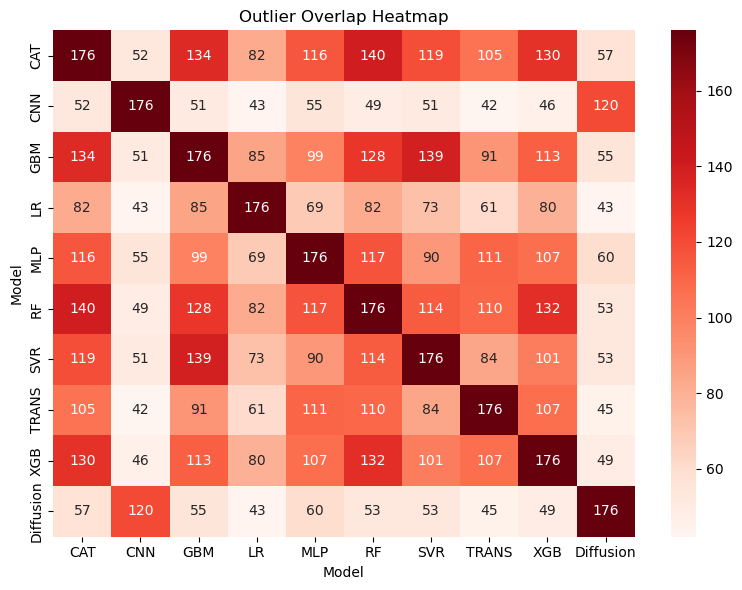

In [7]:
# Calculate the overlap matrix for outlier indices between models
outlier_indices = {col: set(outlier_df[col].index) for col in model_list}
import numpy as np

# Initialize the overlap matrix
overlap_matrix = np.zeros((len(model_list), len(model_list)), dtype=int)
for i, model_i in enumerate(model_list):
    for j, model_j in enumerate(model_list):
        # Count the number of overlapping outlier indices between two models
        overlap_matrix[i, j] = len(outlier_indices[model_i] & outlier_indices[model_j])

import seaborn as sns
import matplotlib.pyplot as plt

# Plot the overlap matrix as a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(overlap_matrix, annot=True, fmt="d", cmap="Reds", xticklabels=model_list, yticklabels=model_list)
plt.title("Outlier Overlap Heatmap")
plt.xlabel("Model")
plt.ylabel("Model")
plt.tight_layout()
plt.show()

## outlier count

In [8]:
# Sort value_counts by the outlier_count value (index), not by count
print(test_with_pred["outlier_count"].value_counts().sort_index(ascending=False))

outlier_count
10      17
9       15
8       32
7       22
6       30
5       25
4       40
3       43
2      111
1      229
0     2944
Name: count, dtype: int64


# pca and umap for substrate

In [9]:
from sklearn.decomposition import PCA

pca = PCA(n_components=0.95)
pca.fit(np.vstack(data_with_pred["metabolite_features"].values))
X_pca = pca.fit_transform(np.vstack(test_with_pred["metabolite_features"].values))
test_with_pred["PCA_feature"] = [x.tolist() for x in X_pca]
data_with_pred["PCA_feature"] = [x.tolist() for x in pca.transform(np.vstack(data_with_pred["metabolite_features"].values))]
test_with_pred

,ECNumber,Organism,Smiles,Substrate,Sequence,Raw Kd,Unit,Log Kd,metabolite_features,protein_features,label,CAT_pred,CNN_pred,GBM_pred,LR_pred,MLP_pred,RF_pred,SVR_pred,TRANS_pred,XGB_pred,Diffusion_pred,CAT_error,CNN_error,GBM_error,LR_error,MLP_error,RF_error,SVR_error,TRANS_error,XGB_error,Diffusion_error,protein_id,protein_label,CAT_is_outlier,CNN_is_outlier,GBM_is_outlier,LR_is_outlier,MLP_is_outlier,RF_is_outlier,SVR_is_outlier,TRANS_is_outlier,XGB_is_outlier,Diffusion_is_outlier,outlier_count,PCA_feature
41,1.14.15.15,Rattus norvegicus,CC(C)CCCC(C)C1CCC2C1(C(CC3C2C(CC4C3(CCC(C4)O)C...,"3alpha,7alpha,12alpha-Trihydroxy-5beta-cholestane",MAVLSRMRLRWALLDTRVMGHGLCPQGARAKAAIPAALRDHESTEG...,0.600,s^(-1),-0.221849,"[1.0617397, -0.20793666, 0.094830774, -0.50530...","[0.07364797, -0.13969214, 0.25316873, 0.030930...",0.221849,1.215337,0.200758,0.950008,0.661839,1.414379,1.467589,1.151390,1.769117,1.855904,0.460500,0.993488,-0.021091,0.728159,0.439990,1.192530,1.245740,0.929541,1.547268,1.634055,0.238651,1,1_Oxidoreductases,0,0,0,0,0,0,0,0,0,0,0,"[-6.176886081695557, -0.23198764026165009, 7.4..."
42,5.3.1.24,Streptomyces coelicolor,C1=CC=C(C(=C1)C(=O)O)NC2C(C(C(O2)COP(=O)(O)O)O)O,N-(5-Phospho-D-ribosyl)anthranilate,MSKLELLPAVDVRDGQAVALVHGESGTETSYGSPLEAALAWQRSGA...,1.400,s^(-1),0.146128,"[0.18575475, -0.5215635, -0.54604053, 0.202770...","[-0.0042093913, -0.057975672, 0.096759625, 0.0...",-0.146128,-0.678302,-0.182784,-0.875126,0.123989,-0.588660,-0.424506,-0.296751,-0.004498,-0.990309,-0.210196,-0.532174,-0.036656,-0.728998,0.270117,-0.442532,-0.278378,-0.150623,0.141630,-0.844181,-0.064068,5,5_Isomerases,0,0,0,0,0,0,0,0,0,0,0,"[-3.9589719772338867, -2.1558425426483154, -1...."
43,5.3.1.24,Streptomyces coelicolor,C1=CC=C(C(=C1)C(=O)O)NC2C(C(C(O2)COP(=O)(O)O)O)O,N-(5-Phospho-D-ribosyl)anthranilate,MSKLELLPAVDVRDGQAVRLVHGESGTETSYGSPLEAALAWQRSGA...,12.000,s^(-1),1.079181,"[0.18575475, -0.5215635, -0.54604053, 0.202770...","[-0.0031800412, -0.060417343, 0.09705618, 0.05...",-1.079181,-0.704235,-0.246446,-0.875126,0.174618,-0.580260,-0.360248,-0.291852,-0.030485,-0.962880,-0.347764,0.374947,0.832736,0.204055,1.253799,0.498921,0.718933,0.787329,1.048696,0.116301,0.731417,5,5_Isomerases,0,0,0,0,0,0,0,0,0,0,0,"[-3.9590277671813965, -2.155888795852661, -1.5..."
44,5.3.1.24,Thermotoga maritima,C1=CC=C(C(=C1)C(=O)O)NC2C(C(C(O2)COP(=O)(O)O)O)O,N-(5-Phospho-D-ribosyl)anthranilate,MVRVKICGITNLEDALFSVESGADAVGFVFYPKSKRYISPEDARRI...,130.000,s^(-1),2.113943,"[0.18575475, -0.5215635, -0.54604053, 0.202770...","[-0.036679424, -0.08852099, 0.12287206, 0.2527...",-2.113943,-0.678706,-1.755249,-0.867506,0.752972,-1.042321,-0.660716,-0.152593,-1.105213,-0.640231,-2.080386,1.435238,0.358695,1.246437,2.866915,1.071622,1.453228,1.961350,1.008730,1.473712,0.033558,5,5_Isomerases,0,0,0,0,0,0,0,0,0,0,0,"[-3.959017276763916, -2.155880928039551, -1.53..."
45,5.3.1.24,Saccharomyces cerevisiae,C1=CC=C(C(=C1)C(=O)O)NC2C(C(C(O2)COP(=O)(O)O)O)O,N-(5-Phospho-D-ribosyl)anthranilate,MSVINFTGSSGPLVKVCGLQSTEAAECALDSDADLLGIICVPNRKR...,69.000,s^(-1),1.838849,"[0.18575475, -0.5215635, -0.54604053, 0.202770...","[0.05722015, -0.05957426, 0.11640474, 0.085117...",-1.838849,-0.533380,-1.475499,-0.732791,0.135891,0.104081,-0.377902,-0.210141,0.531488,-0.882018,-1.655276,1.305469,0.363351,1.106058,1.974740,1.942930,1.460947,1.628708,2.370337,0.956831,0.183573,5,5_Isomerases,0,0,0,0,0,0,0,0,0,0,0,"[-3.9590003490448, -2.155890941619873, -1.5377..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16996,1.3.1.12,Escherichia coli,C1=CC(C=CC1O)(CC(=O)C(=O)O)C(=O)O,Prephenate,MVAELTALRDQIDEVDKALLNLLAKRLELVAEVGEVKSRFGLPIYV...,19.000,s^(-1),1.278754,"[-0.40549156, -0.08218168, -0.19777139, 0.0038...","[-0.0689919, -0.18721327, 0.12279018, -0.07115...",-1.278754,-0.803970,0.106001,-0.616404,-1.957233,-0.674470,-0.784425,-0.192541,-0.530505,-0.842939,0.410

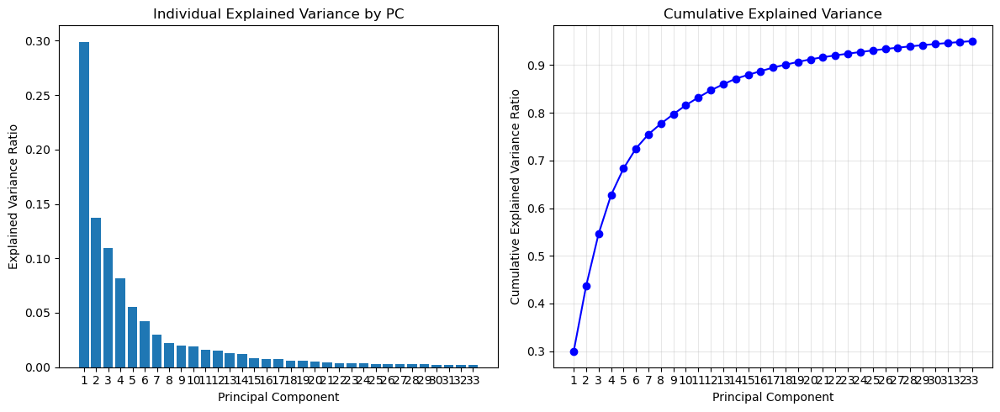

In [10]:
# 繪製 variance 解釋比例圖
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance_ratio)

plt.figure(figsize=(12, 5))

# Individual variance plot
plt.subplot(1, 2, 1)
plt.bar(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio)
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
plt.title('Individual Explained Variance by PC')
plt.xticks(range(1, len(explained_variance_ratio) + 1))

# Cumulative variance plot
plt.subplot(1, 2, 2)
plt.plot(range(1, len(cumulative_variance) + 1), cumulative_variance, 'bo-')
plt.xlabel('Principal Component')
plt.ylabel('Cumulative Explained Variance Ratio')
plt.title('Cumulative Explained Variance')
plt.xticks(range(1, len(cumulative_variance) + 1))
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()


In [11]:
data_with_pred

,ECNumber,Organism,Smiles,Substrate,Sequence,Raw Kd,Unit,Log Kd,metabolite_features,protein_features,label,CAT_pred,CNN_pred,GBM_pred,LR_pred,MLP_pred,RF_pred,SVR_pred,TRANS_pred,XGB_pred,Diffusion_pred,CAT_error,CNN_error,GBM_error,LR_error,MLP_error,RF_error,SVR_error,TRANS_error,XGB_error,Diffusion_error,protein_id,protein_label,PCA_feature
0,4.2.3.4,Actinidia chinensis,C(C(C(C(COP(=O)(O)O)O)O)O)C(=O)C(=O)O,3-deoxy-D-arabino-heptulosonic acid 7-phosphate,MAAFSLSAKQILSPSTHRPSLSKTTTADSSLRFRNPHSLSLRCSSL...,20.1000,s^(-1),1.303196,"[0.09045384, -0.6035856, -0.5294743, 0.0703877...","[-0.12646541, -0.15512069, 0.0834027, 0.213126...",-1.303196,-0.644848,-0.619227,-0.301786,0.743626,-1.575755,-0.884804,-0.581229,-1.480462,-0.664261,-0.139242,0.658348,0.683969,1.001410,2.046822,-0.272559,0.418392,0.721967,-0.177266,0.638936,1.163954,4,4_Lyases,"[1.4646743535995483, -5.523257732391357, -1.30..."
1,4.2.3.4,Aspergillus nidulans,C(C(C(C(COP(=O)([O-])[O-])O)O)O)C(=O)C(=O)[O-],3-deoxy-D-arabino-heptulosonate 7-phosphate,MSNPTKISILGRESIIADFGLWRNYVAKDLISDCSSTTYVLVTDTN...,6.8000,s^(-1),0.832509,"[0.4610253, 0.039623156, -0.4662559, 0.4188257...","[-0.10084063, -0.099633686, -0.011382125, 0.10...",-0.832509,-0.303772,-0.758445,-0.252302,-0.536251,-0.999811,-0.832143,-0.368639,-1.017558,-0.559303,-0.748740,0.528737,0.074064,0.580207,0.296258,-0.167302,0.000366,0.463870,-0.185049,0.273206,0.083769,4,4_Lyases,"[1.5615191459655762, -3.6613473892211914, 1.78..."
2,4.2.3.4,Neurospora crassa,C(C(C(C(COP(=O)(O)O)O)O)O)C(=O)C(=O)O,3-deoxy-D-arabino-heptulosonic acid 7-phosphate,MAEPISNPTRINILGKDNIIIDHGIWLNFVAQDLLQNIKSSTYILI...,19.0000,s^(-1),1.278754,"[0.09045384, -0.6035856, -0.5294743, 0.0703877...","[-0.12705962, -0.09898393, 0.0041820942, 0.096...",-1.278754,-0.665893,-0.974795,-0.509204,-0.552631,-1.650064,-1.143277,-0.741210,-1.447336,-0.604814,-1.206407,0.612861,0.303958,0.769550,0.726122,-0.371311,0.135476,0.537543,-0.168582,0.673940,0.072347,4,4_Lyases,"[1.4646743535995483, -5.523257732391357, -1.30..."
3,2.1.1.255,Streptomyces coelicolor,C[S+](CCC(C(=O)[O-])N)CC1C(C(C(O1)N2C=NC3=C(N=...,S-Adenosyl-L-methionine,MTTETTTATATAKIPAPATPYQEDIARYWNNEARPVNLRLGDVDGL...,0.0075,s^(-1),-2.124939,"[0.52348095, -0.18665986, -0.39555183, 0.11716...","[0.0015065962, -0.087554656, -0.014490904, -0....",2.124939,1.496999,1.851475,0.931642,0.847141,2.050489,1.592264,1.053919,2.204185,1.654265,1.582940,-0.627939,-0.273463,-1.193297,-1.277797,-0.074450,-0.532675,-1.071019,0.079246,-0.470674,-0.541999,2,2_Transferases,"[-5.0538506507873535, 0.551914632320404, 0.112..."
4,2.1.1.255,Streptomyces coelicolor,CC(=CCCC(=C(C)COP(=O)(O)OP(=O)(O)O)C)C,(E)-2-Methylgeranyl diphosphate,MTTETTTATATAKIPAPATPYQEDIARYWNNEARPVNLRLGDVDGL...,0.0390,s^(-1),-1.408935,"[0.17630623, -0.4595529, -0.6368343, -0.136045...","[0.0015065962, -0.087554656, -0.014490904, -0....",1.408935,0.742891,1.006470,0.210814,0.322262,1.763957,1.126935,0.803932,1.352959,0.965339,1.300688,-0.666045,-0.402465,-1.198121,-1.086674,0.355022,-0.282000,-0.605004,-0.055976,-0.443596,-0.108247,2,2_Transferases,"[2.3890771865844727, -3.9370226860046387, -1.1..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17005,1.1.1.82,Zea mays,C1C=CN(C=C1C(=O)N)C2C(C(C(O2)COP(=O)(O)OP(=O)(...,NADPH,MGLSTVYSPAGPRLVPAPLGRCRSAQPRRPRRAPLATVRCSVDATK...,955.0000,s^(-1),2.980003,"[0.36284313, -0.21340896, -0.8913718, -0.23485...","[0.039386757, -0.04558141, 0.101506, 0.1012840...",-2.980003,-1.724458,-2.525772,-1.216283,-0.879139,-1.468125,-1.021392,-1.523099,-1.779884,-1.661642,-2.568395,1.255546,0.454232,1.763721,2.100864,1.511878,1.958611,1.456905,1.200119,1.318361,0.411608,1,1_Oxidoreductases,"[-7.456309795379639, -1.2118772268295288, -0.4..."
17006,1.1.1.82,Zea mays,C(C(C(=O)O)O)C(=O)O,L-Malate,MGLSTVYSPAGPRLVPAPLGRCRSAQPRRPRRAPLATVRCSVDATK...,2.9000,s^(-1),0.462398,"[0.045168612, -0.31311044, -0.21087039, -0.292...","[0.039386757, -0.0

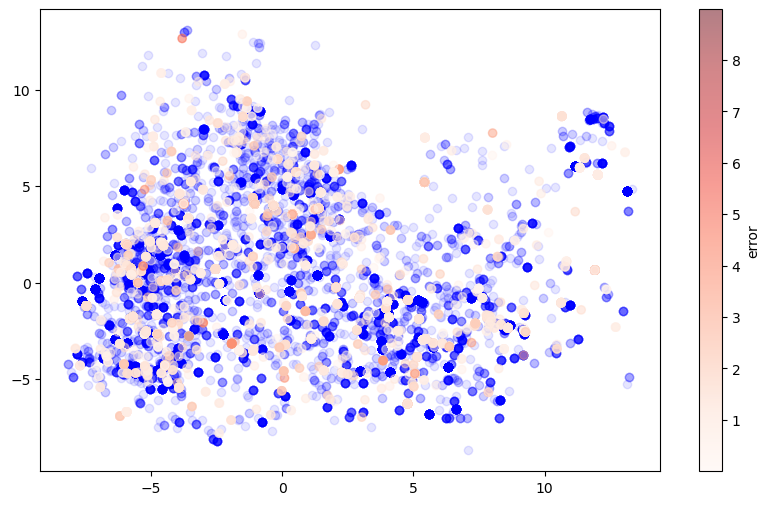

In [12]:
plt.figure(figsize=(10, 6))
pc1_values = [pca_feat[0] for pca_feat in test_with_pred["PCA_feature"]]
pc2_values = [pca_feat[1] for pca_feat in test_with_pred["PCA_feature"]]

plt.scatter(
    [pca_feat[0] for pca_feat in data_with_pred.loc[index_info['train_index'],"PCA_feature"]],
    [pca_feat[1] for pca_feat in data_with_pred.loc[index_info['train_index'],"PCA_feature"]],
    color="b",
    alpha=0.1,
)
plt.scatter(
    pc1_values,
    pc2_values,
    c=np.abs(test_with_pred["CAT_error"]),
    cmap="Reds",
    alpha=0.5,
)

# plt.scatter(


plt.colorbar(label='error')
plt.show()

In [13]:

import umap
import sklearn
print(f"UMAP version: {umap.__version__}")
print(f"scikit-learn version: {sklearn.__version__}")



UMAP version: 0.5.3
scikit-learn version: 1.2.2


In [14]:
from umap import UMAP
import matplotlib.pyplot as plt
# delete the duplicate rows
X_all = np.vstack(data_with_pred["metabolite_features"].values)
X_test = np.vstack(test_with_pred["metabolite_features"].values)

# find unique rows and their indices
unique_rows, unique_indices = np.unique(X_all, axis=0, return_index=True)
print(f"origional data: {X_all.shape[0]} points")
print(f"reduced data: {unique_rows.shape[0]} points")

# use the unique rows to train UMAP
umap_reducer = UMAP(
    n_components=2, 
    random_state=42,
    n_neighbors=15,
    min_dist=0.1
)
umap_reducer.fit(unique_rows)

# transform the test data
X_umap = umap_reducer.transform(X_test)

# save UMAP results to DataFrame
test_with_pred["UMAP_feature"] = [x.tolist() for x in X_umap]
data_with_pred["UMAP_feature"] = [x.tolist() for x in umap_reducer.transform(X_all)]



origional data: 17010 points
reduced data: 2706 points


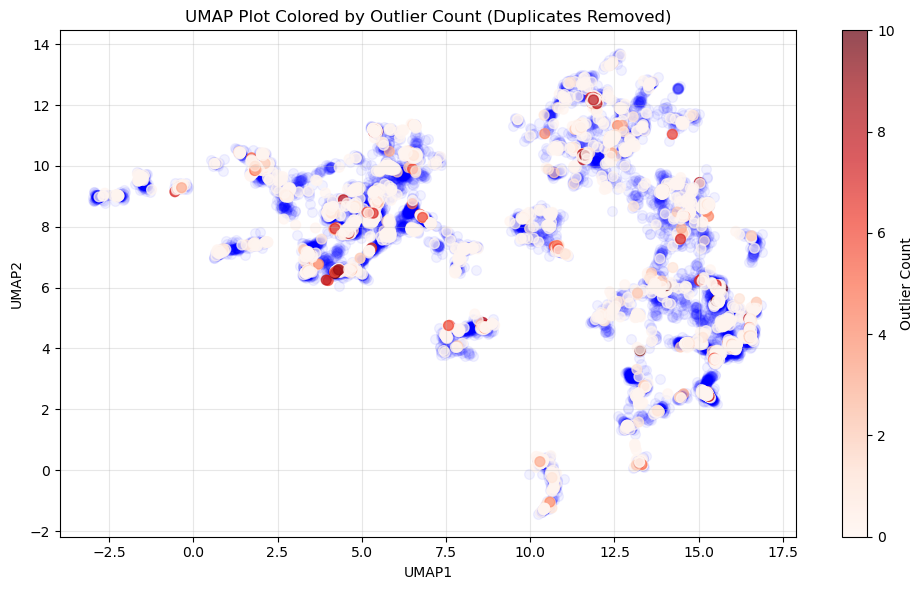

In [15]:

# plot UMAP
plt.figure(figsize=(10, 6))
umap1_values = [umap_feat[0] for umap_feat in test_with_pred["UMAP_feature"]]
umap2_values = [umap_feat[1] for umap_feat in test_with_pred["UMAP_feature"]]
umap1_values_train = [umap_feat[0] for umap_feat in data_with_pred.loc[index_info['train_index'],"UMAP_feature"]]
umap2_values_train = [umap_feat[1] for umap_feat in data_with_pred.loc[index_info['train_index'],"UMAP_feature"]]

plt.scatter(
    umap1_values_train,
    umap2_values_train,
    color="b",
    alpha=0.05,
    s=50
)
plt.scatter(
    umap1_values,
    umap2_values,
    c=test_with_pred["outlier_count"],
    cmap="Reds",
    alpha=0.7,
    s=50
)
plt.colorbar(label='Outlier Count')
plt.xlabel('UMAP1')
plt.ylabel('UMAP2')
plt.title('UMAP Plot Colored by Outlier Count (Duplicates Removed)')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig("./outlier_data/umap_plot.png",dpi=600)
plt.savefig("./outlier_data/umap_plot.svg")
plt.show()

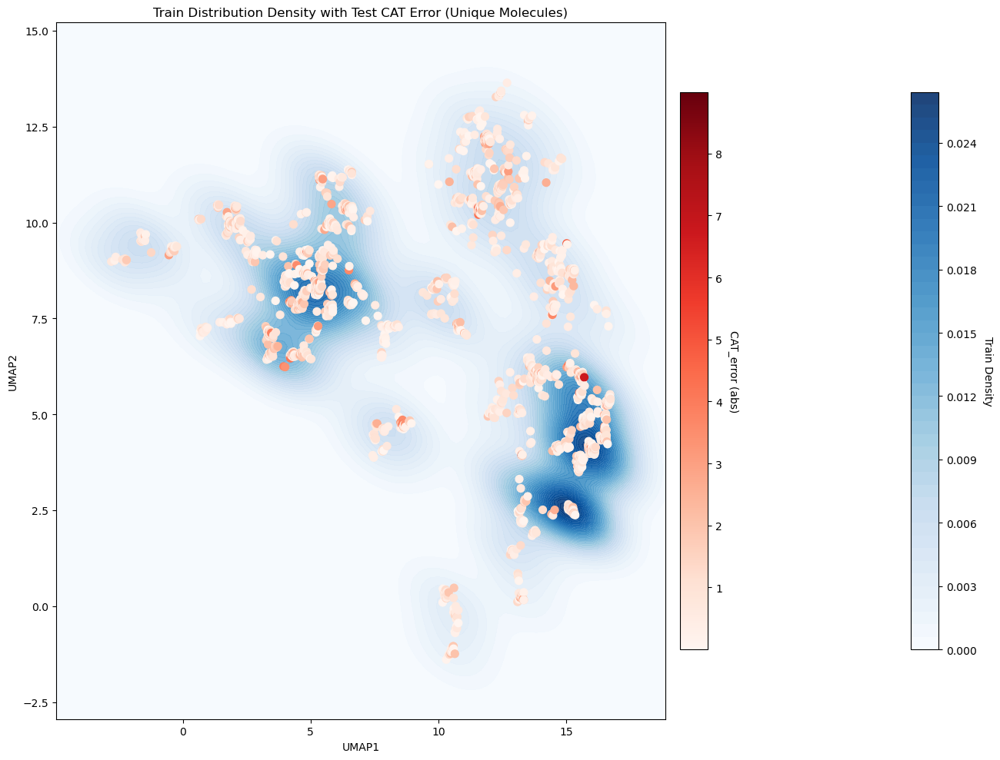

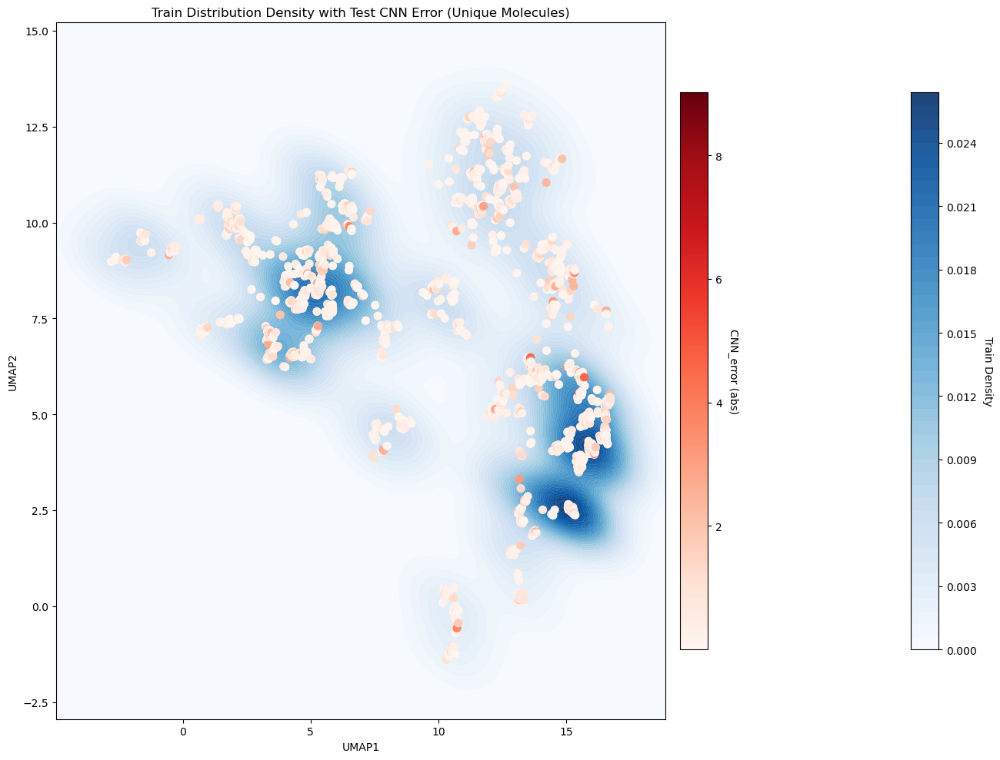

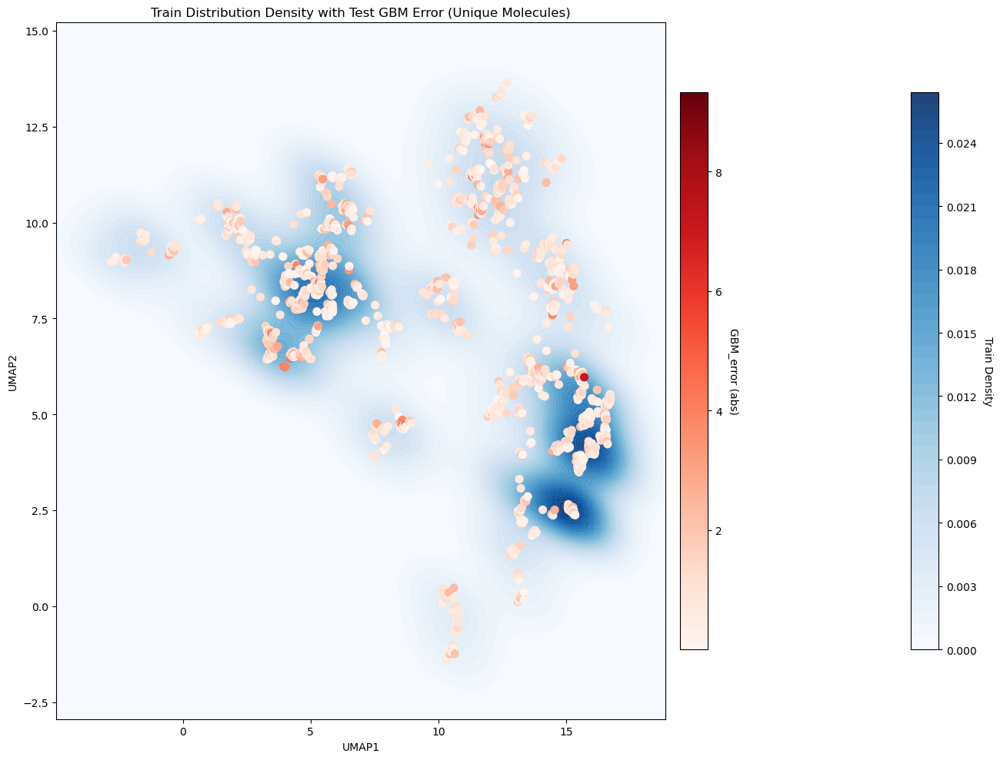

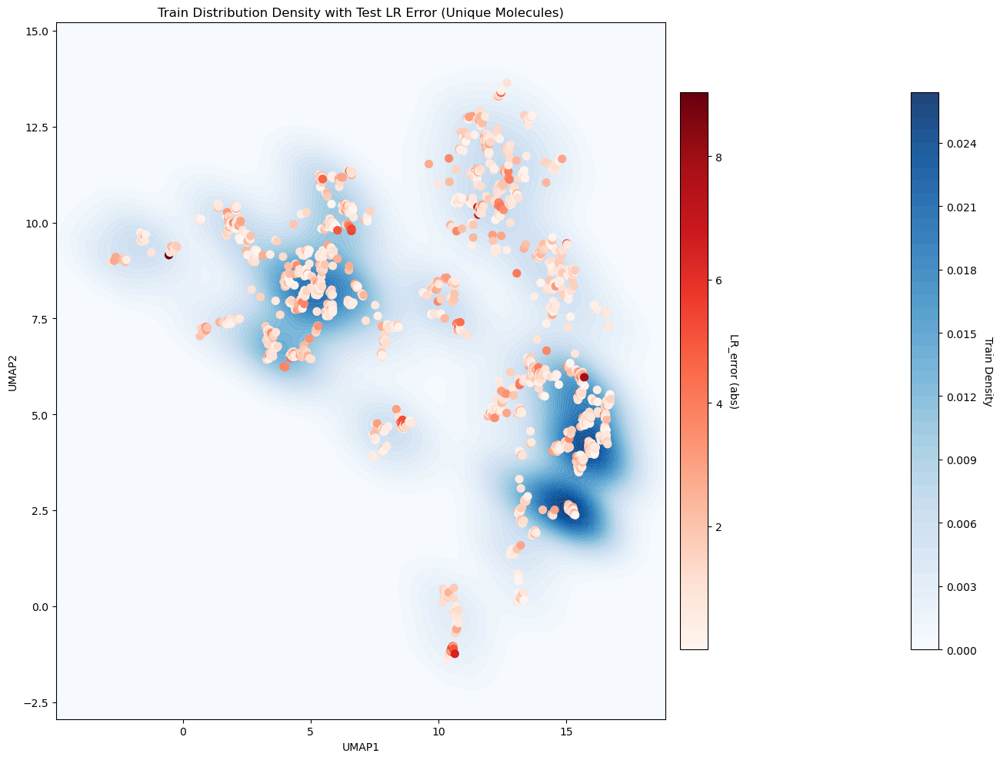

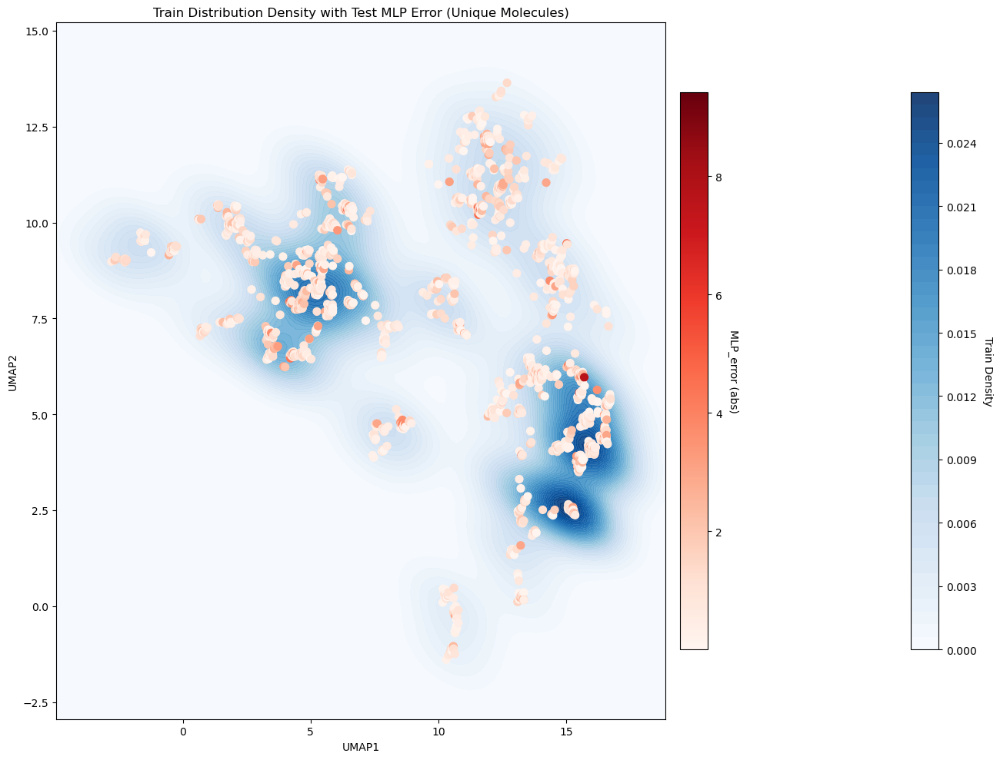

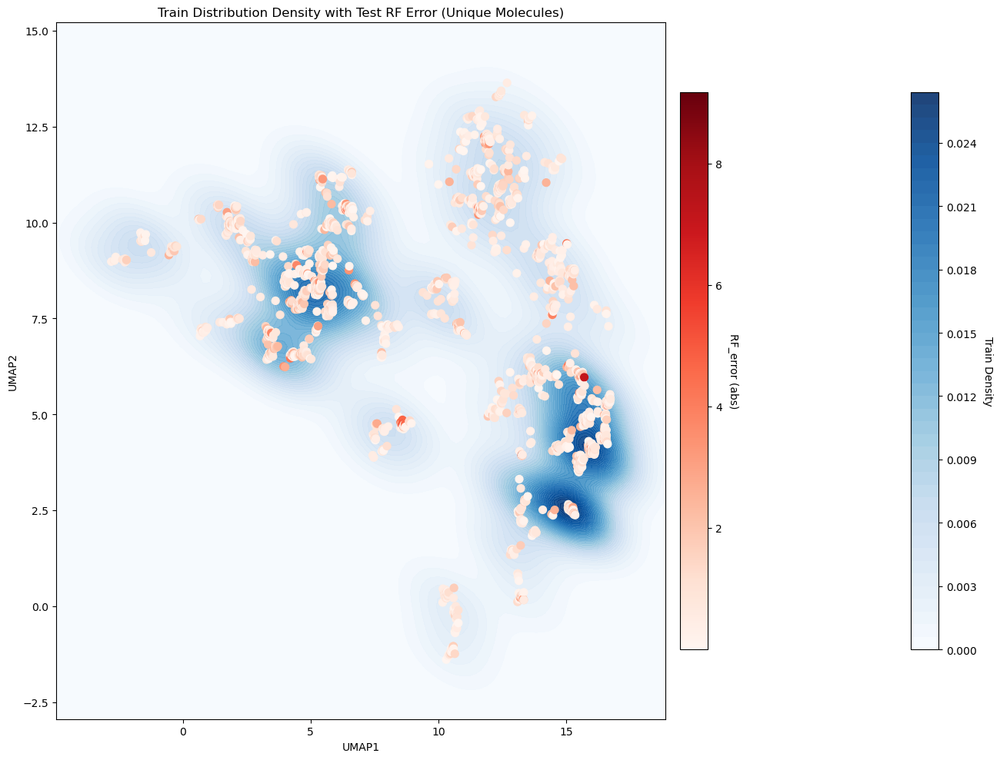

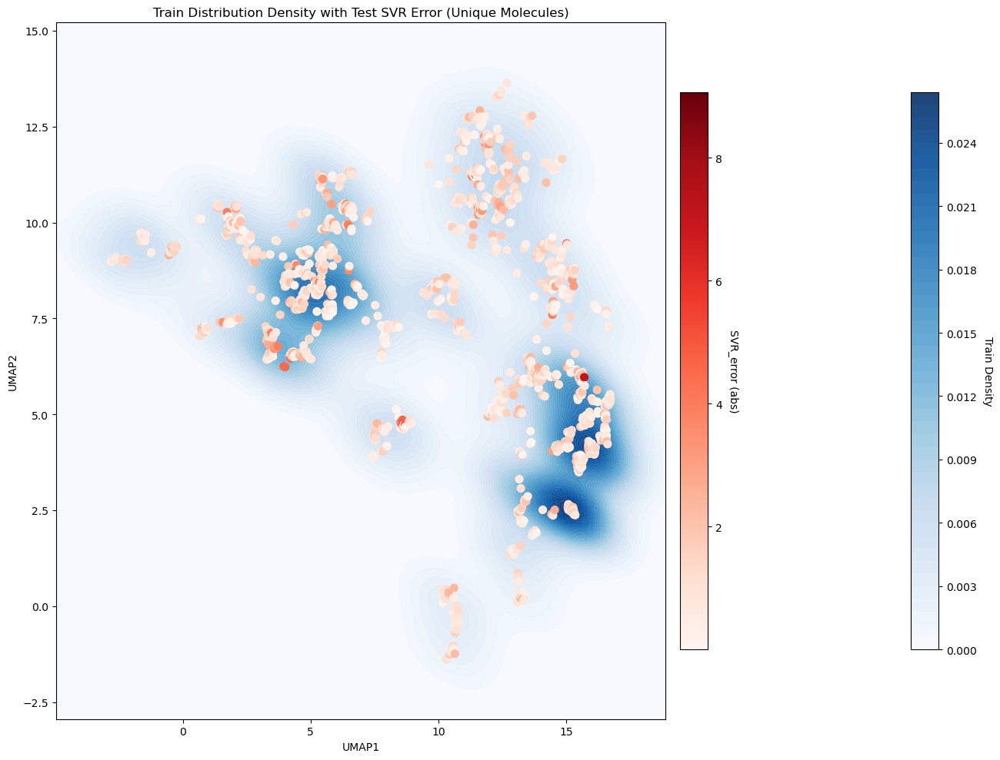

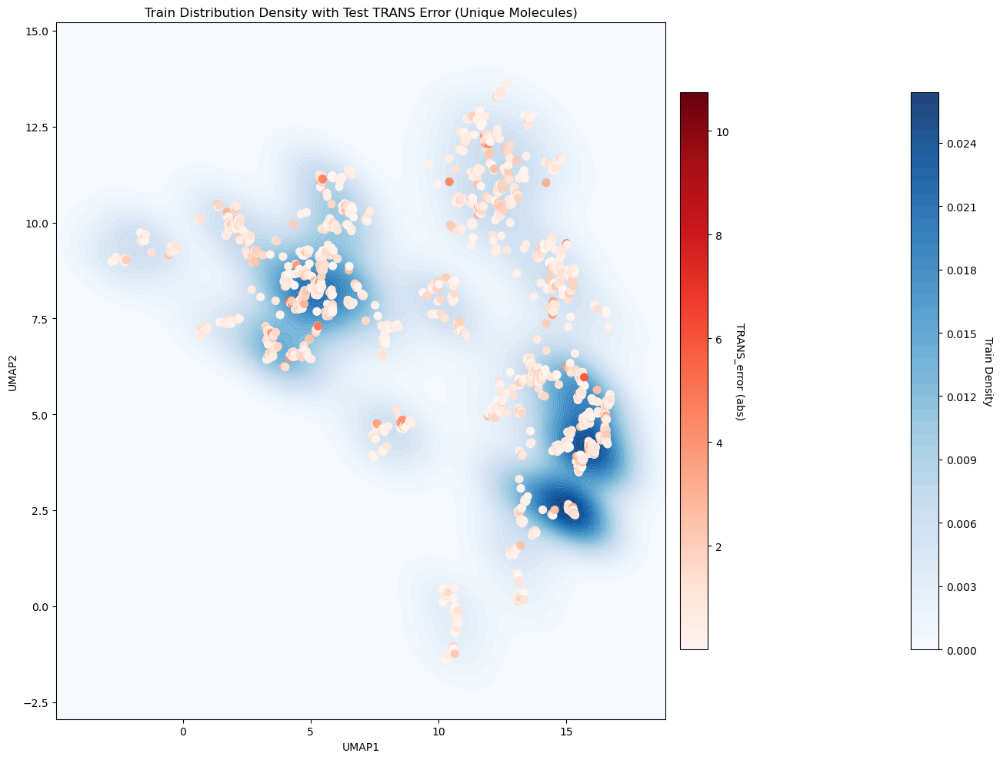

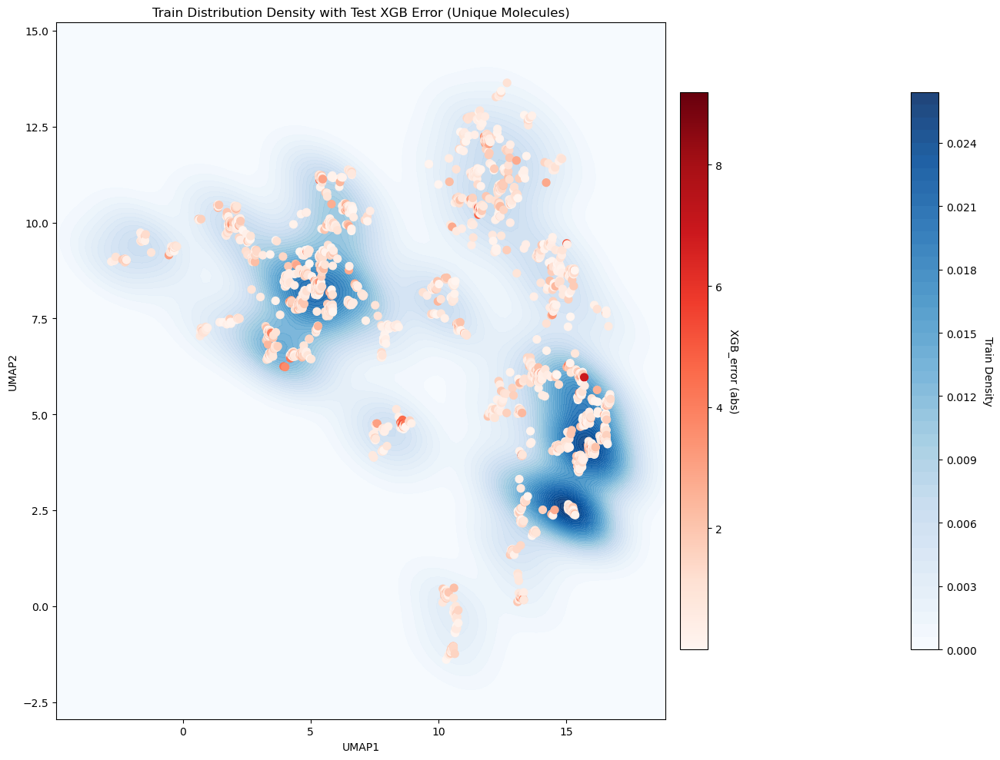

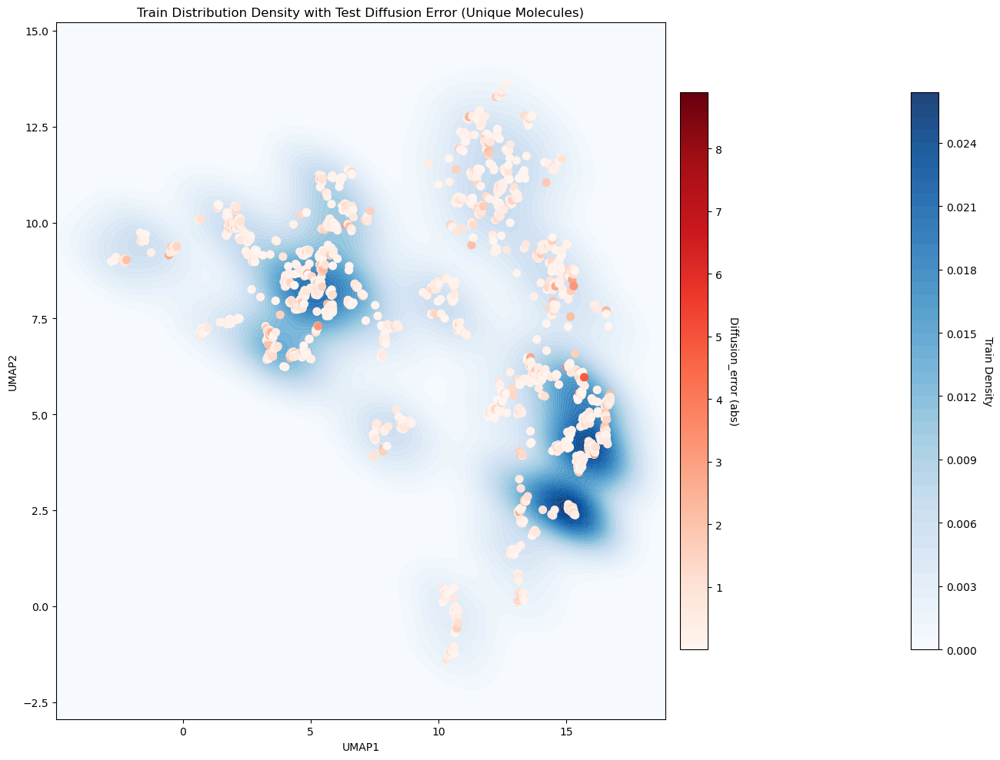

In [16]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde

# Get UMAP features for training set
umap_train = np.array([x for x in data_with_pred.loc[index_info['train_index'], "UMAP_feature"]])

# Create grid (with padding)
x_padding = (umap_train[:, 0].max() - umap_train[:, 0].min()) * 0.1
y_padding = (umap_train[:, 1].max() - umap_train[:, 1].min()) * 0.1

x_min, x_max = umap_train[:, 0].min() - x_padding, umap_train[:, 0].max() + x_padding
y_min, y_max = umap_train[:, 1].min() - y_padding, umap_train[:, 1].max() + y_padding

xx, yy = np.meshgrid(
    np.linspace(x_min, x_max, 100),
    np.linspace(y_min, y_max, 100)
)
grid_points = np.vstack([xx.ravel(), yy.ravel()])

# Calculate density using KDE
kde = gaussian_kde(umap_train.T)
density = kde(grid_points).reshape(xx.shape)

for col in model_list:
    # Find unique molecules and keep only the one with maximum absolute error
    test_filtered = test_with_pred.copy()
    test_filtered['abs_error'] = np.abs(test_filtered[col+'_error'])
    
    # Group by UMAP coordinates and keep only the maximum error for each unique molecule
    test_filtered['umap_coord'] = test_filtered['UMAP_feature'].apply(tuple)
    test_unique = test_filtered.loc[test_filtered.groupby('umap_coord')['abs_error'].idxmax()]
    
    # Extract coordinates for plotting
    umap1_values_unique = [umap_feat[0] for umap_feat in test_unique["UMAP_feature"]]
    umap2_values_unique = [umap_feat[1] for umap_feat in test_unique["UMAP_feature"]]
    
    # Plot
    fig, ax = plt.subplots(figsize=(14, 10))

    # Layer 1: density heatmap (修改：使藍色更深)
    contour = ax.contourf(xx, yy, density, levels=50, cmap='Blues', alpha=0.9)
    cbar1 = plt.colorbar(contour, ax=ax, shrink=0.8, aspect=20, pad=0.12)
    cbar1.set_label('Train Density', rotation=270, labelpad=15)

    # Layer 2: test points scatter plot (unique molecules only)
    scatter = ax.scatter(
        umap1_values_unique,
        umap2_values_unique,
        c=test_unique['abs_error'],
        cmap="Reds",
        alpha=1,
        s=50
    )
    cbar2 = plt.colorbar(scatter, ax=ax, shrink=0.8, aspect=20, pad=0.02)
    cbar2.set_label(f'{col}_error (abs)', rotation=270, labelpad=15)

    ax.set_xlabel('UMAP1')
    ax.set_ylabel('UMAP2')
    ax.set_title(f'Train Distribution Density with Test {col} Error (Unique Molecules)')
    plt.tight_layout()
    plt.savefig(f"./outlier_data/umap_density_mol_plot_{col}.png", dpi=600)
    plt.savefig(f"./outlier_data/umap_density_mol_plot_{col}.svg")
    plt.show()

# pca and umap for protein



In [17]:
from sklearn.decomposition import PCA

pca = PCA(n_components=0.95)
pca.fit(np.vstack(data_with_pred["protein_features"].values))
X_pca = pca.fit_transform(np.vstack(test_with_pred["protein_features"].values))
test_with_pred["PCA_feature_protein"] = [x.tolist() for x in X_pca]
data_with_pred["PCA_feature_protein"] = [x.tolist() for x in pca.transform(np.vstack(data_with_pred["protein_features"].values))]
test_with_pred

,ECNumber,Organism,Smiles,Substrate,Sequence,Raw Kd,Unit,Log Kd,metabolite_features,protein_features,label,CAT_pred,CNN_pred,GBM_pred,LR_pred,MLP_pred,RF_pred,SVR_pred,TRANS_pred,XGB_pred,Diffusion_pred,CAT_error,CNN_error,GBM_error,LR_error,MLP_error,RF_error,SVR_error,TRANS_error,XGB_error,Diffusion_error,protein_id,protein_label,CAT_is_outlier,CNN_is_outlier,GBM_is_outlier,LR_is_outlier,MLP_is_outlier,RF_is_outlier,SVR_is_outlier,TRANS_is_outlier,XGB_is_outlier,Diffusion_is_outlier,outlier_count,PCA_feature,UMAP_feature,PCA_feature_protein
41,1.14.15.15,Rattus norvegicus,CC(C)CCCC(C)C1CCC2C1(C(CC3C2C(CC4C3(CCC(C4)O)C...,"3alpha,7alpha,12alpha-Trihydroxy-5beta-cholestane",MAVLSRMRLRWALLDTRVMGHGLCPQGARAKAAIPAALRDHESTEG...,0.600,s^(-1),-0.221849,"[1.0617397, -0.20793666, 0.094830774, -0.50530...","[0.07364797, -0.13969214, 0.25316873, 0.030930...",0.221849,1.215337,0.200758,0.950008,0.661839,1.414379,1.467589,1.151390,1.769117,1.855904,0.460500,0.993488,-0.021091,0.728159,0.439990,1.192530,1.245740,0.929541,1.547268,1.634055,0.238651,1,1_Oxidoreductases,0,0,0,0,0,0,0,0,0,0,0,"[-6.176886081695557, -0.23198764026165009, 7.4...","[7.535091400146484, 4.381713390350342]","[1.4915740489959717, -0.1431012749671936, -0.6..."
42,5.3.1.24,Streptomyces coelicolor,C1=CC=C(C(=C1)C(=O)O)NC2C(C(C(O2)COP(=O)(O)O)O)O,N-(5-Phospho-D-ribosyl)anthranilate,MSKLELLPAVDVRDGQAVALVHGESGTETSYGSPLEAALAWQRSGA...,1.400,s^(-1),0.146128,"[0.18575475, -0.5215635, -0.54604053, 0.202770...","[-0.0042093913, -0.057975672, 0.096759625, 0.0...",-0.146128,-0.678302,-0.182784,-0.875126,0.123989,-0.588660,-0.424506,-0.296751,-0.004498,-0.990309,-0.210196,-0.532174,-0.036656,-0.728998,0.270117,-0.442532,-0.278378,-0.150623,0.141630,-0.844181,-0.064068,5,5_Isomerases,0,0,0,0,0,0,0,0,0,0,0,"[-3.9589719772338867, -2.1558425426483154, -1....","[15.573312759399414, 3.938293218612671]","[0.8840670585632324, -0.12565448880195618, 1.2..."
43,5.3.1.24,Streptomyces coelicolor,C1=CC=C(C(=C1)C(=O)O)NC2C(C(C(O2)COP(=O)(O)O)O)O,N-(5-Phospho-D-ribosyl)anthranilate,MSKLELLPAVDVRDGQAVRLVHGESGTETSYGSPLEAALAWQRSGA...,12.000,s^(-1),1.079181,"[0.18575475, -0.5215635, -0.54604053, 0.202770...","[-0.0031800412, -0.060417343, 0.09705618, 0.05...",-1.079181,-0.704235,-0.246446,-0.875126,0.174618,-0.580260,-0.360248,-0.291852,-0.030485,-0.962880,-0.347764,0.374947,0.832736,0.204055,1.253799,0.498921,0.718933,0.787329,1.048696,0.116301,0.731417,5,5_Isomerases,0,0,0,0,0,0,0,0,0,0,0,"[-3.9590277671813965, -2.155888795852661, -1.5...","[15.525772094726562, 3.9348597526550293]","[0.909468412399292, -0.13045544922351837, 1.21..."
44,5.3.1.24,Thermotoga maritima,C1=CC=C(C(=C1)C(=O)O)NC2C(C(C(O2)COP(=O)(O)O)O)O,N-(5-Phospho-D-ribosyl)anthranilate,MVRVKICGITNLEDALFSVESGADAVGFVFYPKSKRYISPEDARRI...,130.000,s^(-1),2.113943,"[0.18575475, -0.5215635, -0.54604053, 0.202770...","[-0.036679424, -0.08852099, 0.12287206, 0.2527...",-2.113943,-0.678706,-1.755249,-0.867506,0.752972,-1.042321,-0.660716,-0.152593,-1.105213,-0.640231,-2.080386,1.435238,0.358695,1.246437,2.866915,1.071622,1.453228,1.961350,1.008730,1.473712,0.033558,5,5_Isomerases,0,0,0,0,0,0,0,0,0,0,0,"[-3.959017276763916, -2.155880928039551, -1.53...","[15.589404106140137, 3.796476125717163]","[0.9153326153755188, 0.9618231058120728, 1.033..."
45,5.3.1.24,Saccharomyces cerevisiae,C1=CC=C(C(=C1)C(=O)O)NC2C(C(C(O2)COP(=O)(O)O)O)O,N-(5-Phospho-D-ribosyl)anthranilate,MSVINFTGSSGPLVKVCGLQSTEAAECALDSDADLLGIICVPNRKR...,69.000,s^(-1),1.838849,"[0.18575475, -0.5215635, -0.54604053, 0.202770...","[0.05722015, -0.05957426, 0.11640474, 0.085117...",-1.838849,-0.533380,-1.475499,-0.732791,0.135891,0.104081,-0.377902,-0.210141,0.531488,-0.882018,-1.655276,1.305469,0.363351,1.106058,1.974740,1.942930,1.460947,1.628708,2.370337,0.956831,0.183573,5,5_Isomerases,0,0,0,0,0,0,0,0,0,0,0,"[-3.9590003490448, -2.155890941619873, -1.5377...","[15.548816680908203, 3.9070682525634766]","[0.45031729340553284, 0.7340245246887207, 0.70..."
...,...,...,...,...,...,...,...,...,..

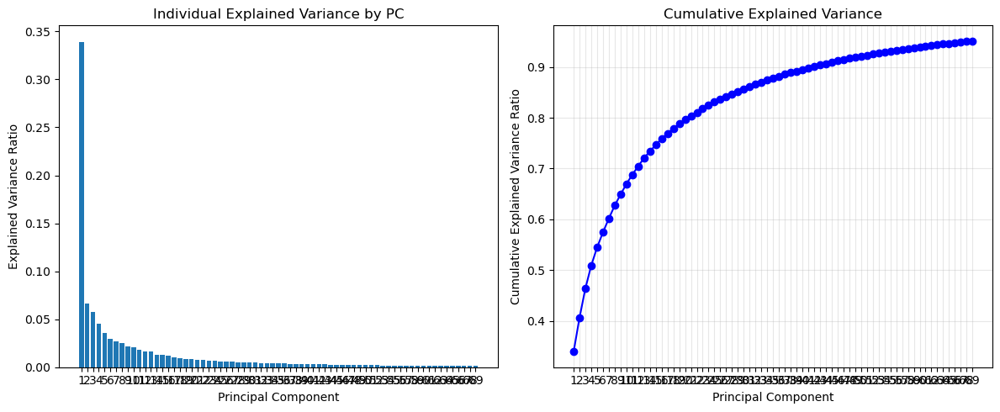

In [18]:
# 繪製 variance 解釋比例圖
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance_ratio)

plt.figure(figsize=(12, 5))

# Individual variance plot
plt.subplot(1, 2, 1)
plt.bar(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio)
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
plt.title('Individual Explained Variance by PC')
plt.xticks(range(1, len(explained_variance_ratio) + 1))

# Cumulative variance plot
plt.subplot(1, 2, 2)
plt.plot(range(1, len(cumulative_variance) + 1), cumulative_variance, 'bo-')
plt.xlabel('Principal Component')
plt.ylabel('Cumulative Explained Variance Ratio')
plt.title('Cumulative Explained Variance')
plt.xticks(range(1, len(cumulative_variance) + 1))
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

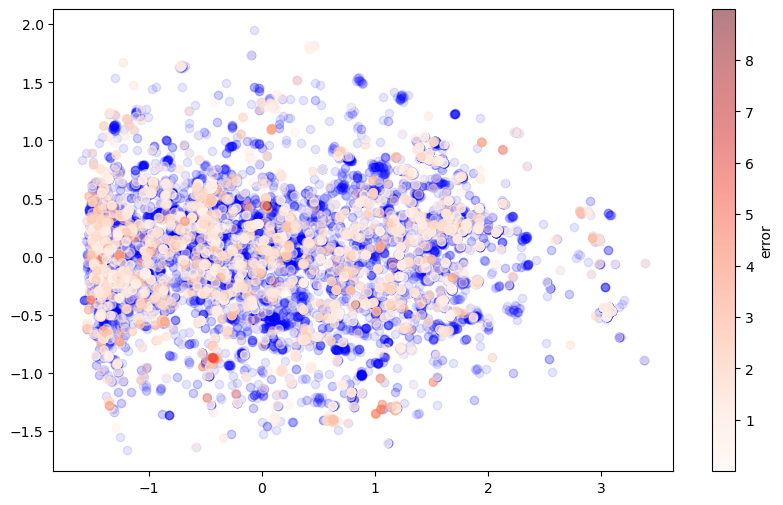

In [19]:
plt.figure(figsize=(10, 6))
pc1_values = [pca_feat[0] for pca_feat in test_with_pred["PCA_feature_protein"]]
pc2_values = [pca_feat[1] for pca_feat in test_with_pred["PCA_feature_protein"]]

plt.scatter(
    [pca_feat[0] for pca_feat in data_with_pred.loc[index_info['train_index'],"PCA_feature_protein"]],
    [pca_feat[1] for pca_feat in data_with_pred.loc[index_info['train_index'],"PCA_feature_protein"]],
    color="b",
    alpha=0.1,
)
plt.scatter(
    pc1_values,
    pc2_values,
    c=np.abs(test_with_pred["CAT_error"]),
    cmap="Reds",
    alpha=0.5,
)

# plt.scatter(


plt.colorbar(label='error')
plt.show()

In [20]:
from umap import UMAP
import matplotlib.pyplot as plt

# delete the duplicate rows
X_all = np.vstack(data_with_pred["protein_features"].values)
X_test = np.vstack(test_with_pred["protein_features"].values)

# find unique rows and their indices
unique_rows, unique_indices = np.unique(X_all, axis=0, return_index=True)
print(f"origional data: {X_all.shape[0]} points")
print(f"reduced data: {unique_rows.shape[0]} points")

# use the unique rows to train UMAP
umap_reducer = UMAP(
    n_components=2, 
    random_state=42,
    n_neighbors=30,
    min_dist=0.5,
    metric='correlation'
)
umap_reducer.fit(unique_rows)

# transform the test data
X_umap = umap_reducer.transform(X_test)

# save UMAP results to DataFrame
test_with_pred["UMAP_feature_protein"] = [x.tolist() for x in X_umap]
data_with_pred["UMAP_feature_protein"] = [x.tolist() for x in umap_reducer.transform(X_all)]

origional data: 17010 points
reduced data: 7857 points


In [21]:
data_with_pred

,ECNumber,Organism,Smiles,Substrate,Sequence,Raw Kd,Unit,Log Kd,metabolite_features,protein_features,label,CAT_pred,CNN_pred,GBM_pred,LR_pred,MLP_pred,RF_pred,SVR_pred,TRANS_pred,XGB_pred,Diffusion_pred,CAT_error,CNN_error,GBM_error,LR_error,MLP_error,RF_error,SVR_error,TRANS_error,XGB_error,Diffusion_error,protein_id,protein_label,PCA_feature,UMAP_feature,PCA_feature_protein,UMAP_feature_protein
0,4.2.3.4,Actinidia chinensis,C(C(C(C(COP(=O)(O)O)O)O)O)C(=O)C(=O)O,3-deoxy-D-arabino-heptulosonic acid 7-phosphate,MAAFSLSAKQILSPSTHRPSLSKTTTADSSLRFRNPHSLSLRCSSL...,20.1000,s^(-1),1.303196,"[0.09045384, -0.6035856, -0.5294743, 0.0703877...","[-0.12646541, -0.15512069, 0.0834027, 0.213126...",-1.303196,-0.644848,-0.619227,-0.301786,0.743626,-1.575755,-0.884804,-0.581229,-1.480462,-0.664261,-0.139242,0.658348,0.683969,1.001410,2.046822,-0.272559,0.418392,0.721967,-0.177266,0.638936,1.163954,4,4_Lyases,"[1.4646743535995483, -5.523257732391357, -1.30...","[5.337472438812256, 7.389566421508789]","[1.1460415124893188, 0.13141095638275146, 0.30...","[0.13427016139030457, -3.2103164196014404]"
1,4.2.3.4,Aspergillus nidulans,C(C(C(C(COP(=O)([O-])[O-])O)O)O)C(=O)C(=O)[O-],3-deoxy-D-arabino-heptulosonate 7-phosphate,MSNPTKISILGRESIIADFGLWRNYVAKDLISDCSSTTYVLVTDTN...,6.8000,s^(-1),0.832509,"[0.4610253, 0.039623156, -0.4662559, 0.4188257...","[-0.10084063, -0.099633686, -0.011382125, 0.10...",-0.832509,-0.303772,-0.758445,-0.252302,-0.536251,-0.999811,-0.832143,-0.368639,-1.017558,-0.559303,-0.748740,0.528737,0.074064,0.580207,0.296258,-0.167302,0.000366,0.463870,-0.185049,0.273206,0.083769,4,4_Lyases,"[1.5615191459655762, -3.6613473892211914, 1.78...","[2.5731775760650635, 9.082439422607422]","[-0.34565818309783936, 0.07750385999679565, 0....","[1.9961323738098145, -0.32733631134033203]"
2,4.2.3.4,Neurospora crassa,C(C(C(C(COP(=O)(O)O)O)O)O)C(=O)C(=O)O,3-deoxy-D-arabino-heptulosonic acid 7-phosphate,MAEPISNPTRINILGKDNIIIDHGIWLNFVAQDLLQNIKSSTYILI...,19.0000,s^(-1),1.278754,"[0.09045384, -0.6035856, -0.5294743, 0.0703877...","[-0.12705962, -0.09898393, 0.0041820942, 0.096...",-1.278754,-0.665893,-0.974795,-0.509204,-0.552631,-1.650064,-1.143277,-0.741210,-1.447336,-0.604814,-1.206407,0.612861,0.303958,0.769550,0.726122,-0.371311,0.135476,0.537543,-0.168582,0.673940,0.072347,4,4_Lyases,"[1.4646743535995483, -5.523257732391357, -1.30...","[5.4020304679870605, 7.388605117797852]","[-0.14045755565166473, 0.010222148150205612, 0...","[2.0600340366363525, -0.8465989232063293]"
3,2.1.1.255,Streptomyces coelicolor,C[S+](CCC(C(=O)[O-])N)CC1C(C(C(O1)N2C=NC3=C(N=...,S-Adenosyl-L-methionine,MTTETTTATATAKIPAPATPYQEDIARYWNNEARPVNLRLGDVDGL...,0.0075,s^(-1),-2.124939,"[0.52348095, -0.18665986, -0.39555183, 0.11716...","[0.0015065962, -0.087554656, -0.014490904, -0....",2.124939,1.496999,1.851475,0.931642,0.847141,2.050489,1.592264,1.053919,2.204185,1.654265,1.582940,-0.627939,-0.273463,-1.193297,-1.277797,-0.074450,-0.532675,-1.071019,0.079246,-0.470674,-0.541999,2,2_Transferases,"[-5.0538506507873535, 0.551914632320404, 0.112...","[16.038673400878906, 5.2538161277771]","[-0.19029955565929413, -0.7155641913414001, -0...","[-3.4832565784454346, 4.661518096923828]"
4,2.1.1.255,Streptomyces coelicolor,CC(=CCCC(=C(C)COP(=O)(O)OP(=O)(O)O)C)C,(E)-2-Methylgeranyl diphosphate,MTTETTTATATAKIPAPATPYQEDIARYWNNEARPVNLRLGDVDGL...,0.0390,s^(-1),-1.408935,"[0.17630623, -0.4595529, -0.6368343, -0.136045...","[0.0015065962, -0.087554656, -0.014490904, -0....",1.408935,0.742891,1.006470,0.210814,0.322262,1.763957,1.126935,0.803932,1.352959,0.965339,1.300688,-0.666045,-0.402465,-1.198121,-1.086674,0.355022,-0.282000,-0.605004,-0.055976,-0.443596,-0.108247,2,2_Transferases,"[2.3890771865844727, -3.9370226860046387, -1.1...","[6.923361301422119, 8.147430419921875]","[-0.19029955565929413, -0.7155641913414001, -0...","[-3.4040915966033936, 4.848831653594971]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,

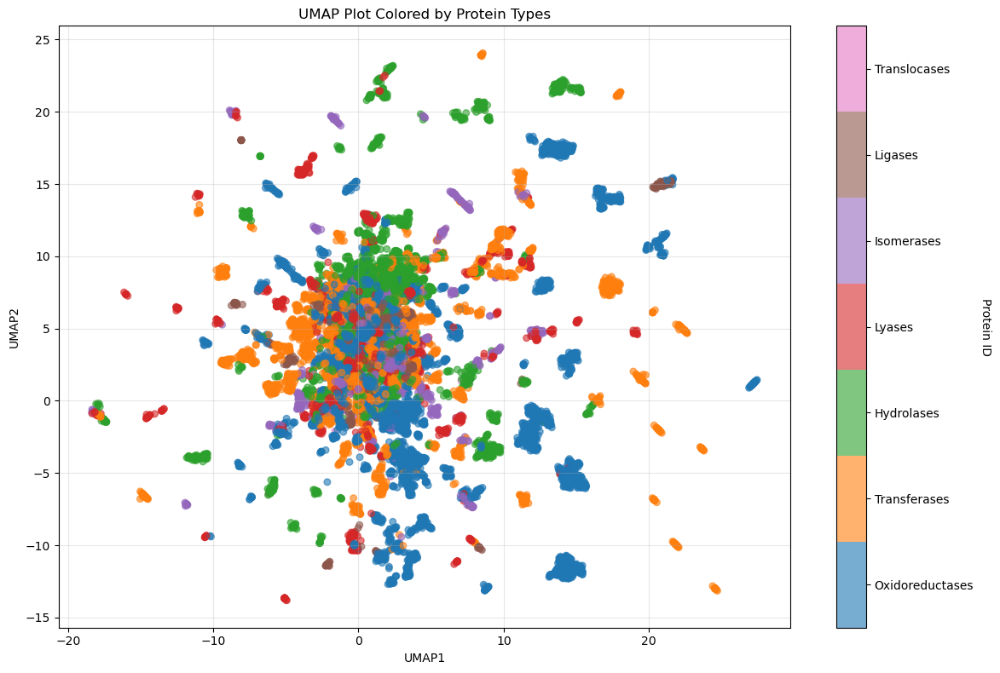

In [22]:
# Plot UMAP with different protein types colored
plt.figure(figsize=(12, 8))

# Get UMAP coordinates for all data
umap1_values_all = [umap_feat[0] for umap_feat in data_with_pred["UMAP_feature_protein"]]
umap2_values_all = [umap_feat[1] for umap_feat in data_with_pred["UMAP_feature_protein"]]

from matplotlib.colors import ListedColormap
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2']
cmap_7 = ListedColormap(colors)


# Use protein_id - 1 to map protein_id 1-7 to colormap indices 0-6
scatter = plt.scatter(
    umap1_values_all,
    umap2_values_all,
    c=data_with_pred['protein_id'] - 1,
    alpha=0.6,
    s=30,
    cmap=cmap_7,
    vmin=0,
    vmax=7
)

# Add colorbar
cbar = plt.colorbar(scatter)
cbar.set_label('Protein ID', rotation=270, labelpad=15)

# Set ticks at the center of each color block
cbar.set_ticks([i + 0.5 for i in range(7)])
cbar.set_ticklabels([PROTEIN_TYPES_NAMES[i] for i in range(1, 8)])

plt.xlabel('UMAP1')
plt.ylabel('UMAP2')
plt.title('UMAP Plot Colored by Protein Types')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig("./outlier_data/umap_protein_types.png", dpi=1200)
plt.savefig("./outlier_data/umap_protein_types.svg")
plt.show()

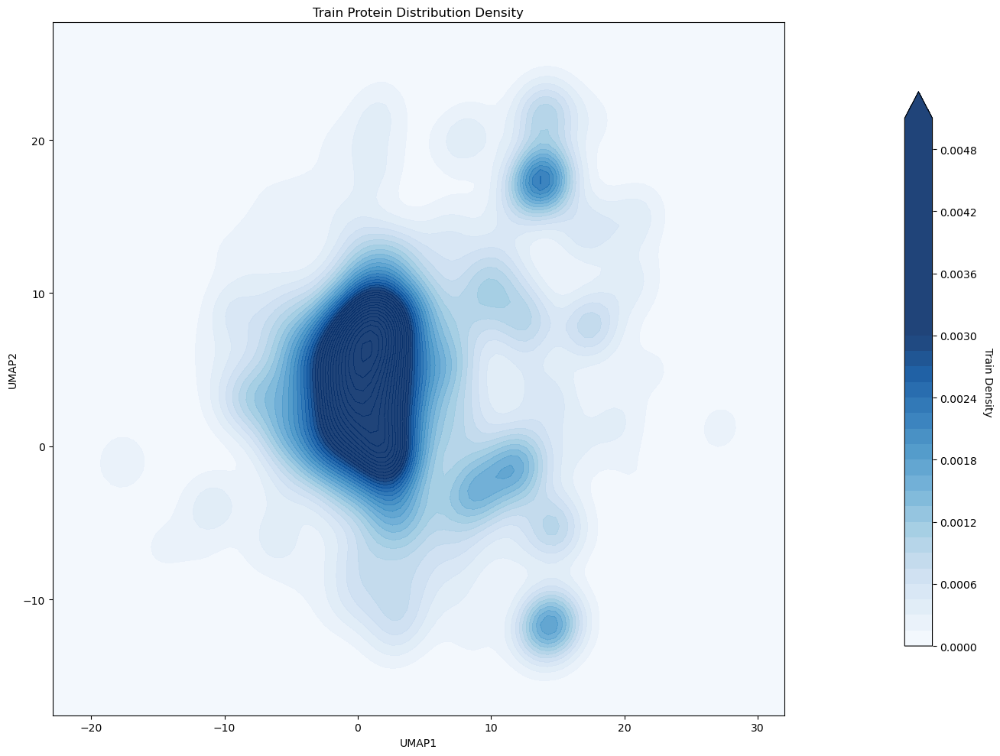

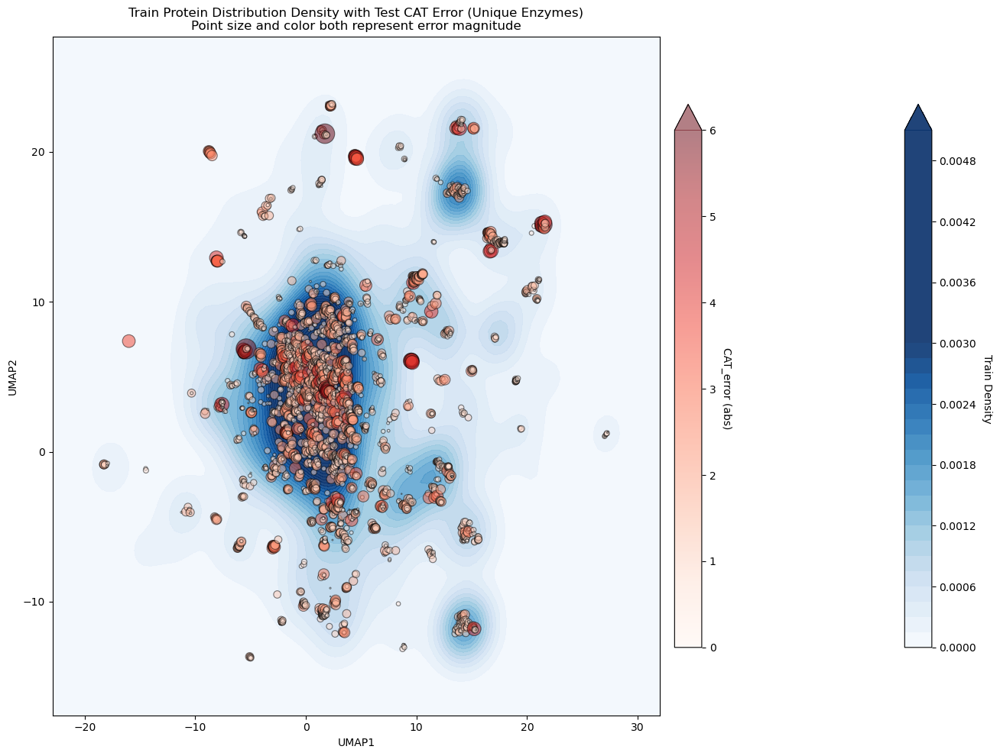

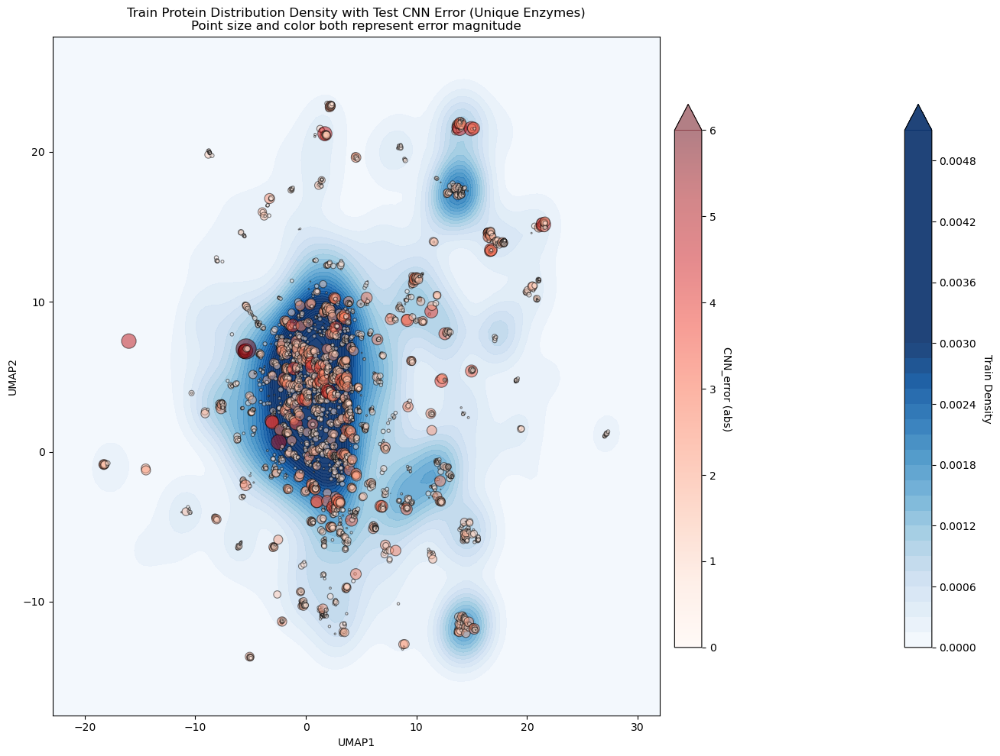

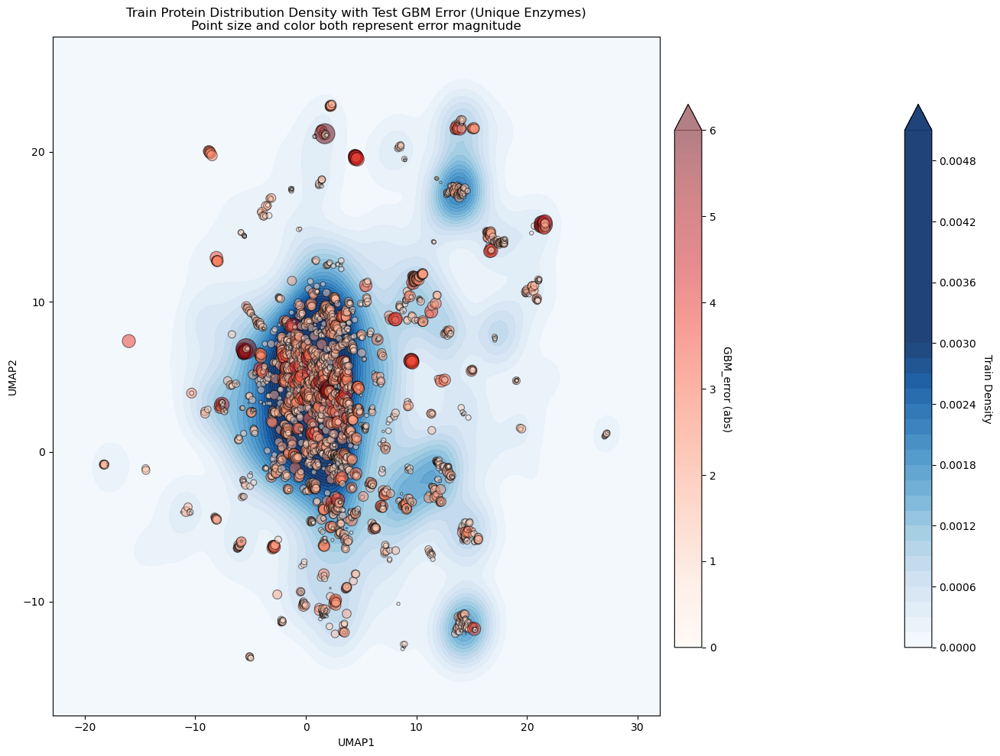

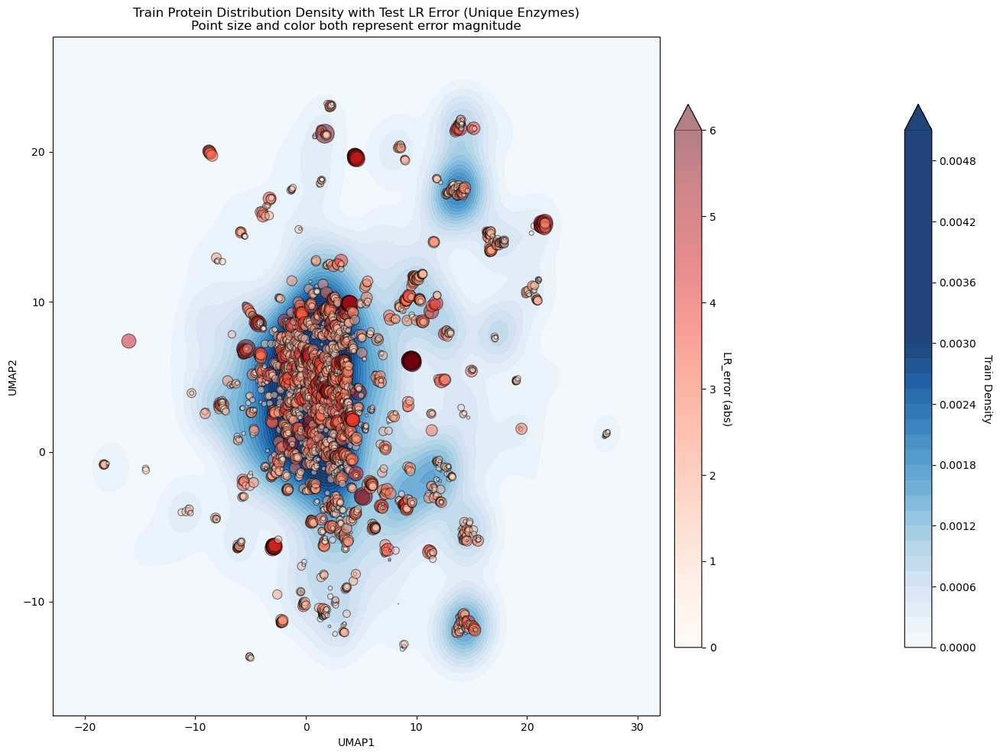

...

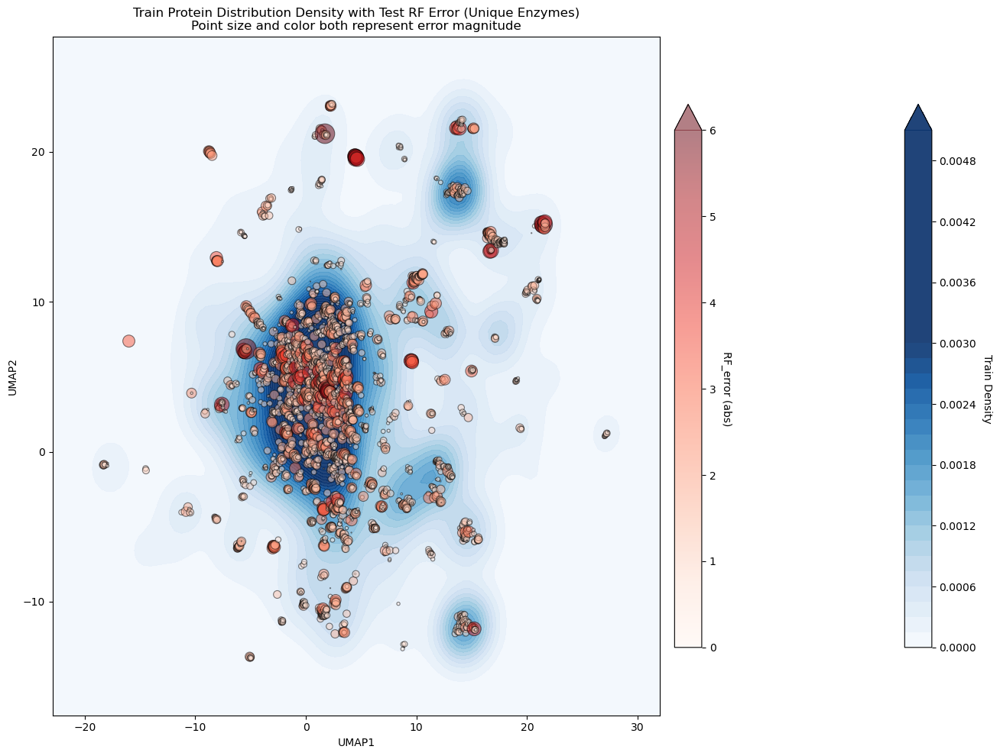

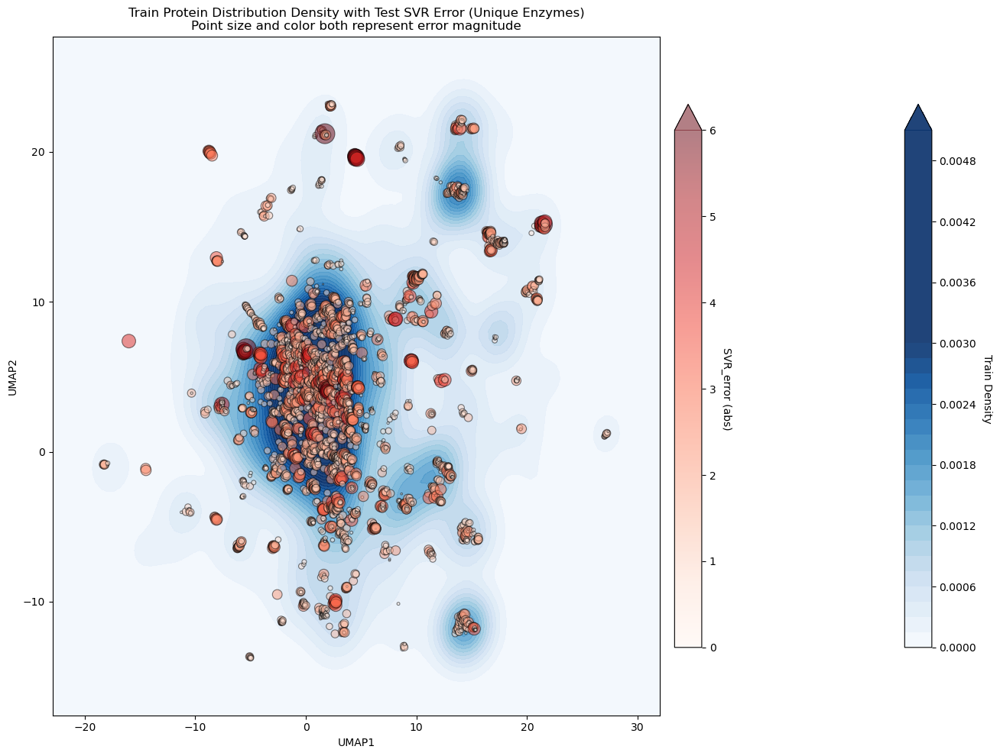

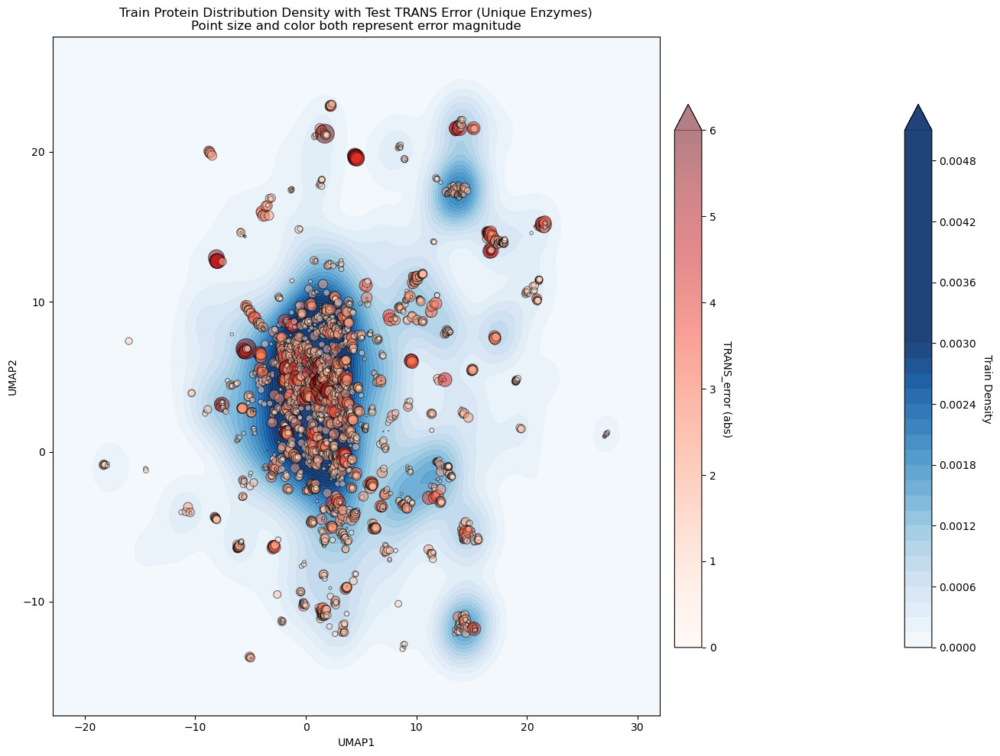

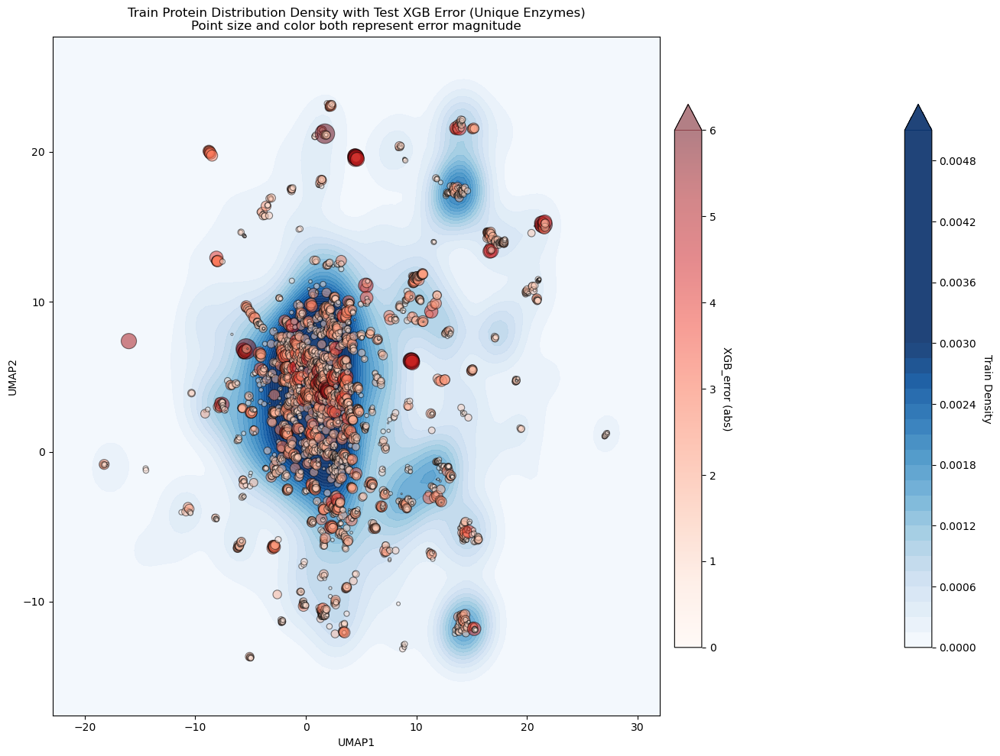

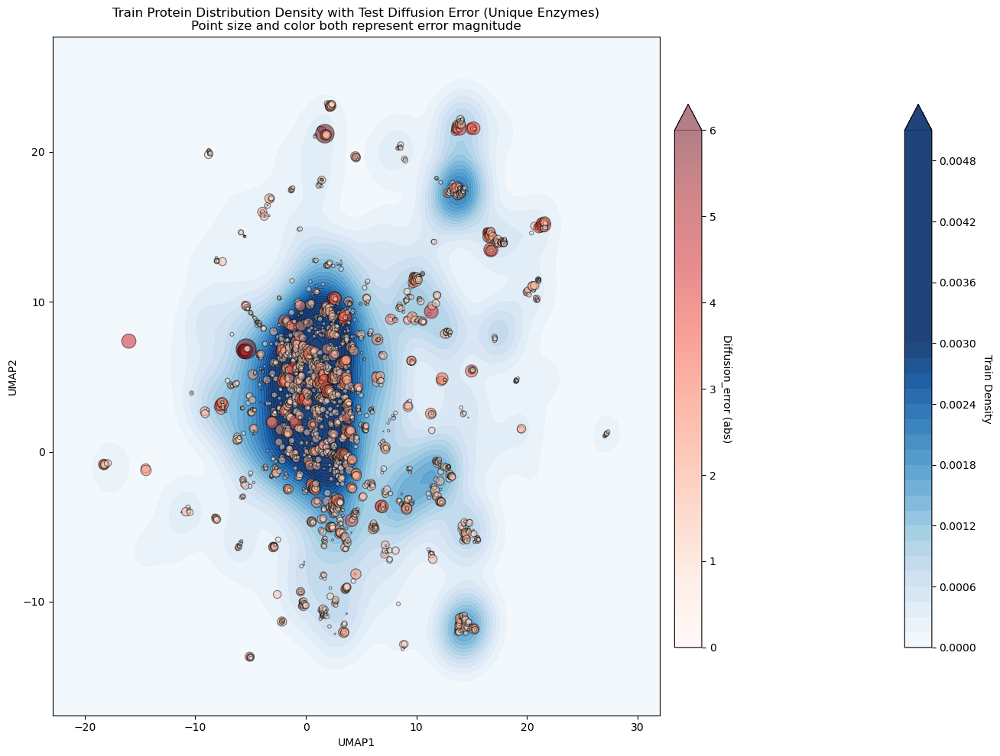

In [23]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde

# Get UMAP features for training set (protein features)
umap_train = np.array([x for x in data_with_pred.loc[index_info['train_index'], "UMAP_feature_protein"]])

# Create grid (with padding)
x_padding = (umap_train[:, 0].max() - umap_train[:, 0].min()) * 0.1
y_padding = (umap_train[:, 1].max() - umap_train[:, 1].min()) * 0.1

x_min, x_max = umap_train[:, 0].min() - x_padding, umap_train[:, 0].max() + x_padding
y_min, y_max = umap_train[:, 1].min() - y_padding, umap_train[:, 1].max() + y_padding

xx, yy = np.meshgrid(
    np.linspace(x_min, x_max, 100),
    np.linspace(y_min, y_max, 100)
)
grid_points = np.vstack([xx.ravel(), yy.ravel()])

# Calculate density using KDE
kde = gaussian_kde(umap_train.T)
density = kde(grid_points).reshape(xx.shape)

fig, ax = plt.subplots(figsize=(14, 10))
contour = ax.contourf(xx, yy, density, levels=50, cmap='Blues', alpha=0.9, vmax=0.003, extend='max') 
cbar1 = plt.colorbar(contour, ax=ax, shrink=0.8, aspect=20, pad=0.12)
cbar1.set_label('Train Density', rotation=270, labelpad=15)
ax.set_xlabel('UMAP1')
ax.set_ylabel('UMAP2')
ax.set_title(f'Train Protein Distribution Density')
plt.tight_layout()
plt.savefig("./outlier_data/umap_density_protein_plot.png", dpi=600)
plt.savefig("./outlier_data/umap_density_protein_plot.svg")
plt.show()

for col in model_list:
    # Find unique molecules and keep only the one with maximum absolute error
    test_filtered = test_with_pred.copy()
    test_filtered['abs_error'] = np.abs(test_filtered[col+'_error'])
    
    # Group by protein UMAP coordinates and keep only the maximum error for each unique molecule
    test_filtered['umap_coord'] = test_filtered['UMAP_feature_protein'].apply(tuple)
    test_unique = test_filtered.loc[test_filtered.groupby('umap_coord')['abs_error'].idxmax()]
    
    # Extract coordinates for plotting (protein features)
    umap1_values_unique = [umap_feat[0] for umap_feat in test_unique["UMAP_feature_protein"]]
    umap2_values_unique = [umap_feat[1] for umap_feat in test_unique["UMAP_feature_protein"]]
    
    # Calculate point sizes based on error (normalize to reasonable range)
    abs_errors = test_unique['abs_error'].values
    min_size = 0
    max_size = 400
    # Normalize errors to size range
    normalized_sizes = min_size + abs_errors/10 * (max_size - min_size)
    
    # Plot
    fig, ax = plt.subplots(figsize=(14, 10))

    # Layer 1: density heatmap 
    contour = ax.contourf(xx, yy, density, levels=50, cmap='Blues', alpha=0.9,vmax=0.003,extend='max')
    cbar1 = plt.colorbar(contour, ax=ax, shrink=0.8, aspect=20, pad=0.12)
    cbar1.set_label('Train Density', rotation=270, labelpad=15)

    # Layer 2: test points scatter plot with size and color both representing error
    scatter = ax.scatter(
        umap1_values_unique,
        umap2_values_unique,
        c=abs_errors,  # Color represents error
        s=normalized_sizes,  # Size represents error
        cmap="Reds",
        alpha=0.5,
        edgecolors='black',  # Add black edge for better visibility
        linewidth=0.8,   
        vmin=0,
		vmax=6,  # Set color limits for better visibility     
    )
    cbar2 = plt.colorbar(scatter, ax=ax, shrink=0.8, aspect=20, pad=0.02, extend='max')
    cbar2.set_label(f'{col}_error (abs)', rotation=270, labelpad=15)

    ax.set_xlabel('UMAP1')
    ax.set_ylabel('UMAP2')
    ax.set_title(f'Train Protein Distribution Density with Test {col} Error (Unique Enzymes)\nPoint size and color both represent error magnitude')
    plt.tight_layout()
    plt.savefig(f"./outlier_data/umap_density_protein_plot_{col}.png", dpi=600)
    plt.savefig(f"./outlier_data/umap_density_protein_plot_{col}.svg")
    plt.show()

In [24]:
# t-SNE analysis for metabolite features
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import numpy as np

# delete the duplicate rows
X_all = np.vstack(data_with_pred["metabolite_features"].values)
X_test = np.vstack(test_with_pred["metabolite_features"].values)

# find unique rows and their indices
unique_rows, unique_indices = np.unique(X_all, axis=0, return_index=True)
print(f"original data: {X_all.shape[0]} points")
print(f"reduced data: {unique_rows.shape[0]} points")

# use t-SNE for dimensionality reduction
tsne_reducer = TSNE(
    n_components=2, 
    random_state=42,
    perplexity=30,
    n_iter=1000,
    learning_rate=200
)

# fit and transform all data
X_tsne_all = tsne_reducer.fit_transform(X_all)
X_tsne_test = X_tsne_all[index_info['test_index']]

# save t-SNE results to DataFrame
test_with_pred["TSNE_feature_protein"] = [x.tolist() for x in X_tsne_test]
data_with_pred["TSNE_feature_protein"] = [x.tolist() for x in X_tsne_all]


original data: 17010 points
reduced data: 2706 points


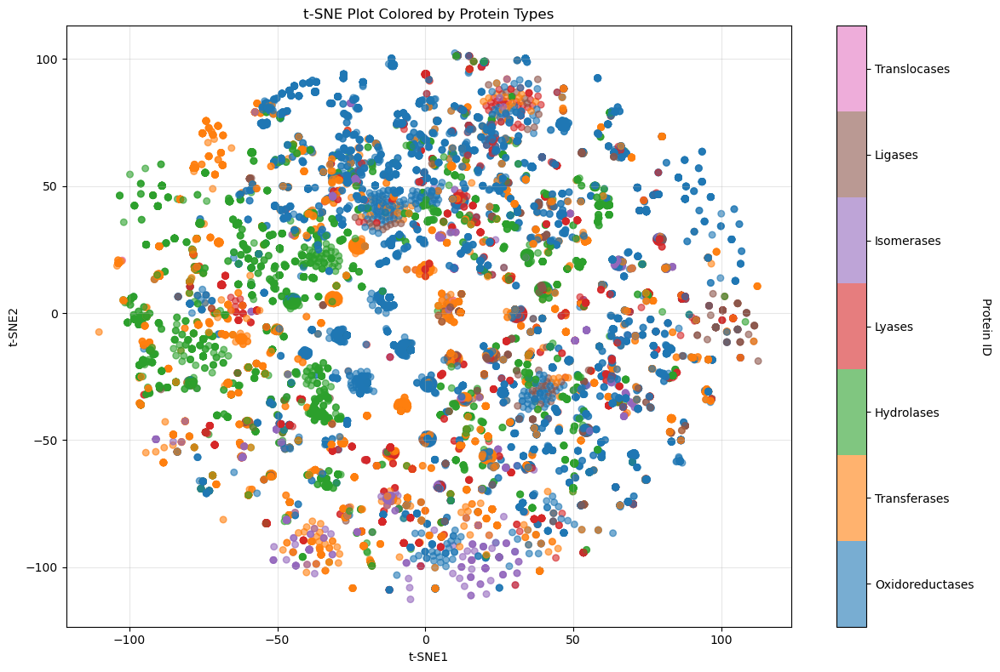

In [25]:
# Plot UMAP with different protein types colored
plt.figure(figsize=(12, 8))

# Get t-SNE coordinates for all data
tsne1_values_all = [tsne_feat[0] for tsne_feat in data_with_pred["TSNE_feature_protein"]]
tsne2_values_all = [tsne_feat[1] for tsne_feat in data_with_pred["TSNE_feature_protein"]]

from matplotlib.colors import ListedColormap
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2']
cmap_7 = ListedColormap(colors)


# Use protein_id - 1 to map protein_id 1-7 to colormap indices 0-6
scatter = plt.scatter(
    tsne1_values_all,
    tsne2_values_all,
    c=data_with_pred['protein_id'] - 1,
    alpha=0.6,
    s=30,
    cmap=cmap_7,
    vmin=0,
    vmax=7
)

# Add colorbar
cbar = plt.colorbar(scatter)
cbar.set_label('Protein ID', rotation=270, labelpad=15)

# Set ticks at the center of each color block
cbar.set_ticks([i + 0.5 for i in range(7)])
cbar.set_ticklabels([PROTEIN_TYPES_NAMES[i] for i in range(1, 8)])

plt.xlabel('t-SNE1')
plt.ylabel('t-SNE2')
plt.title('t-SNE Plot Colored by Protein Types')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig("./outlier_data/tsne_protein_types.png", dpi=1200)
plt.savefig("./outlier_data/tsne_protein_types.svg")
plt.show()

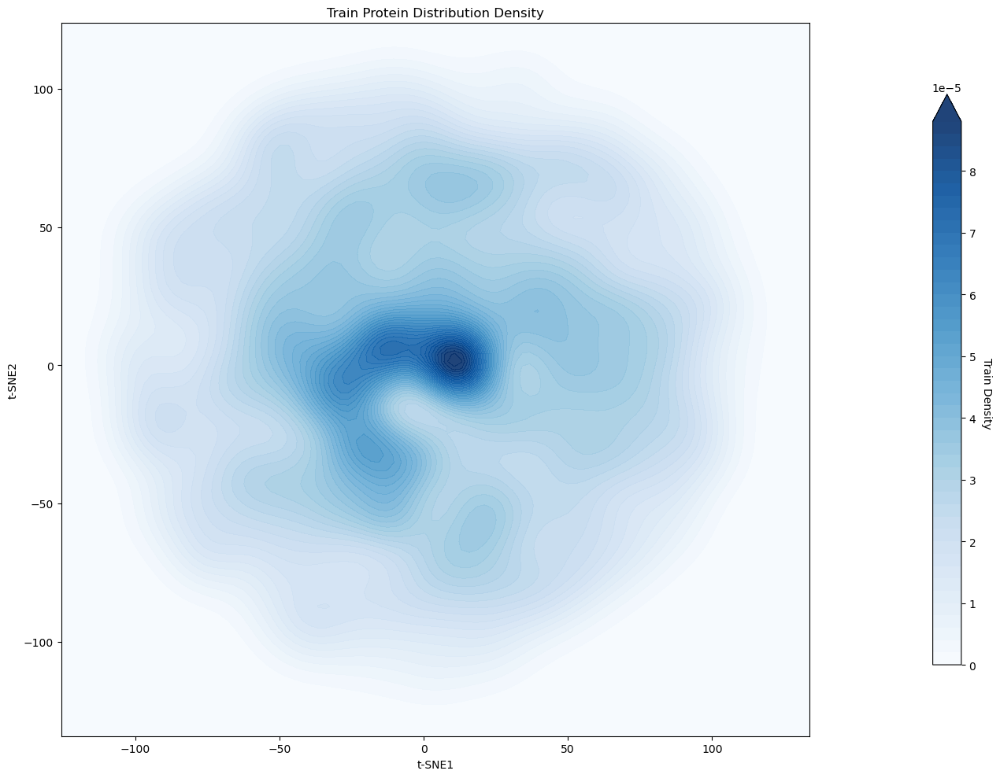

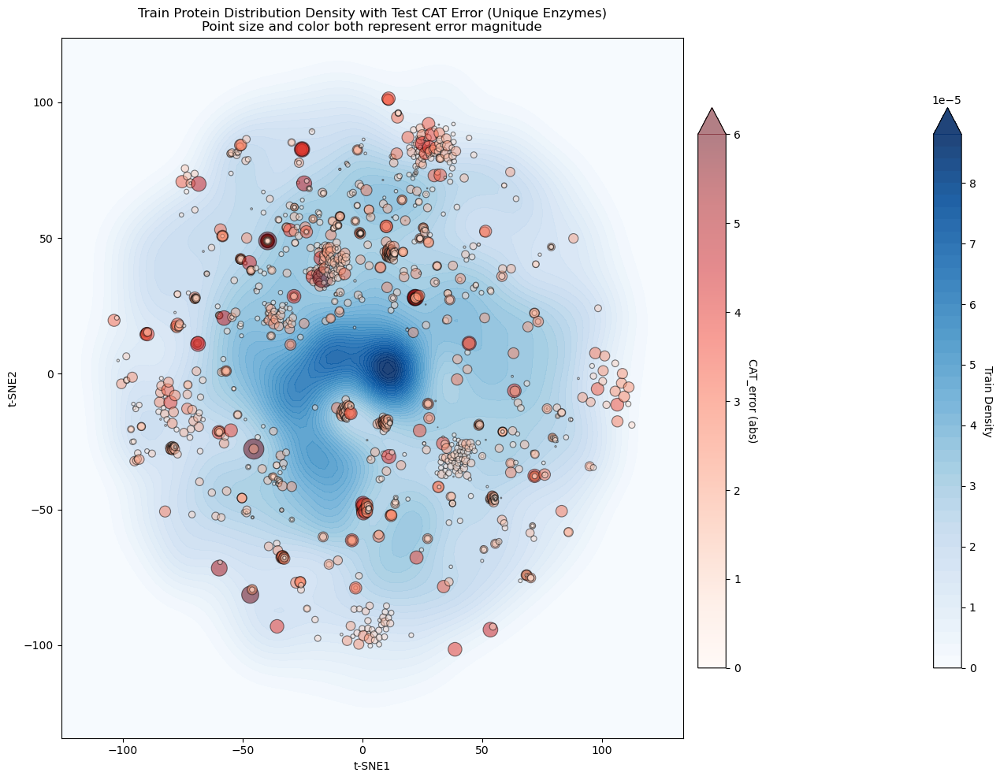

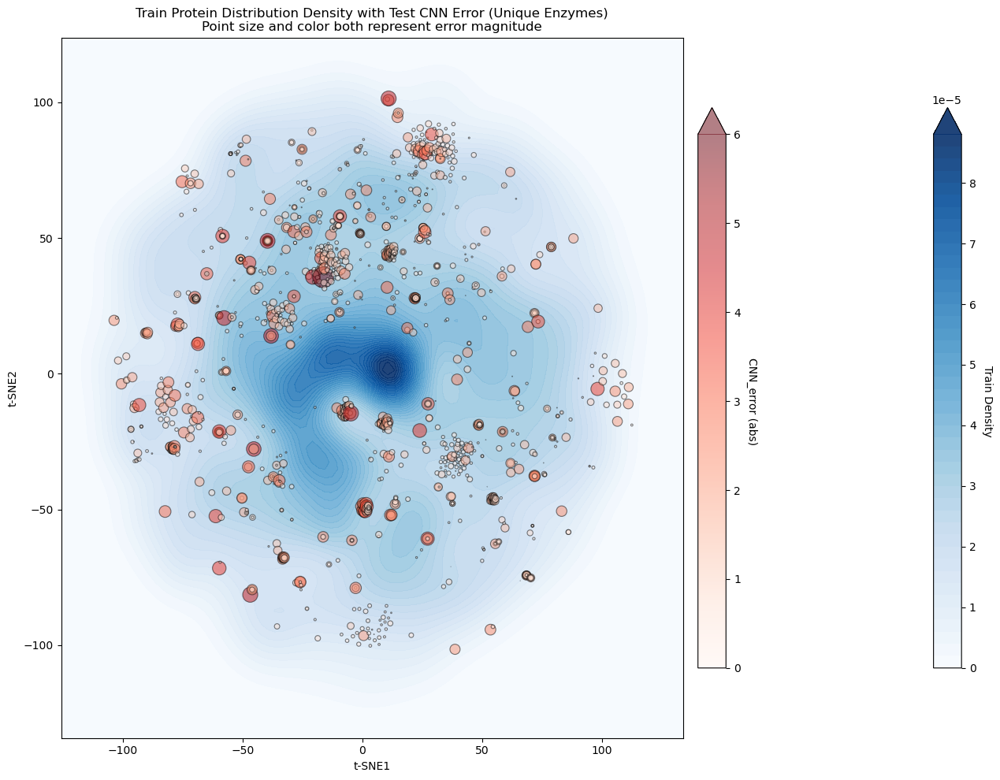

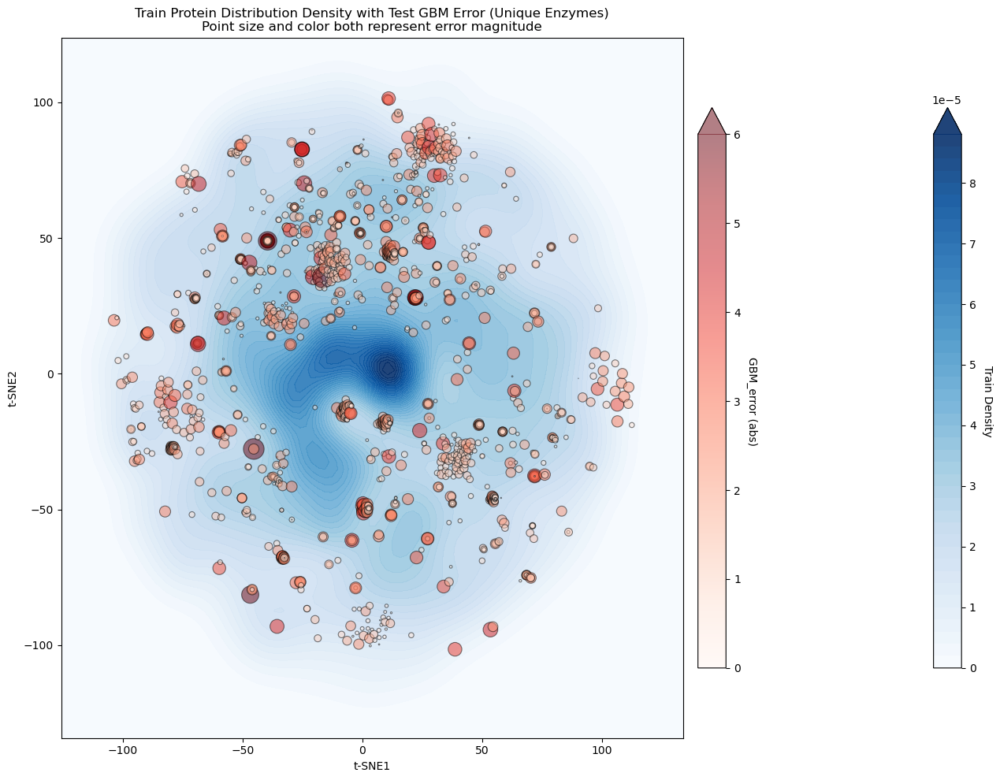

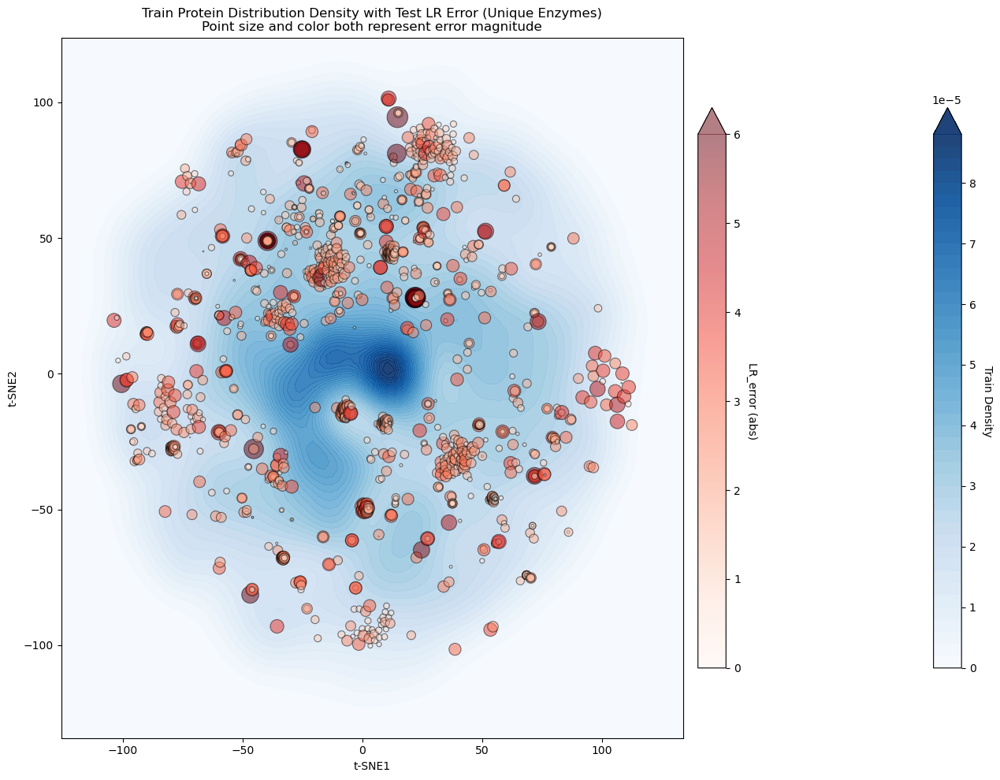

...

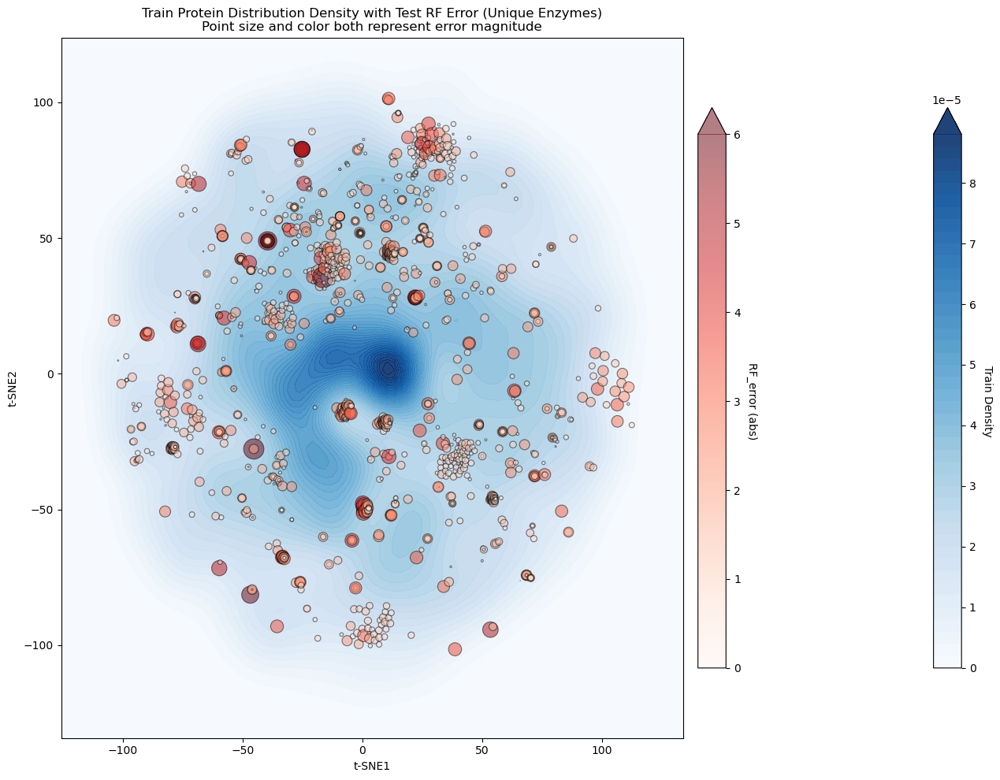

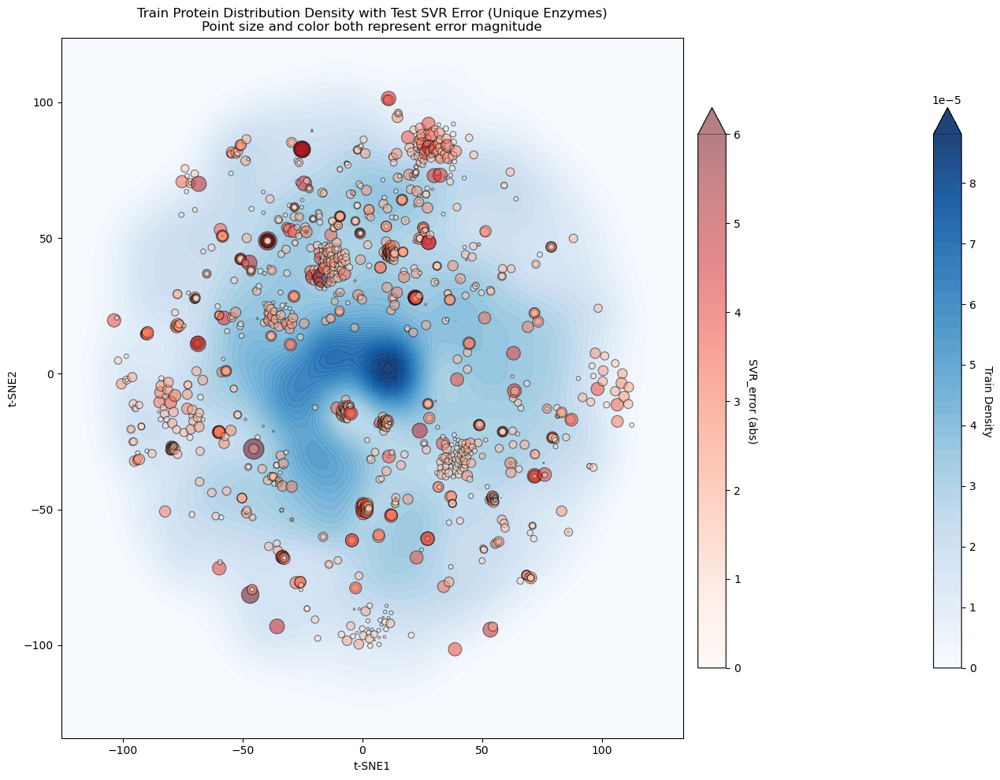

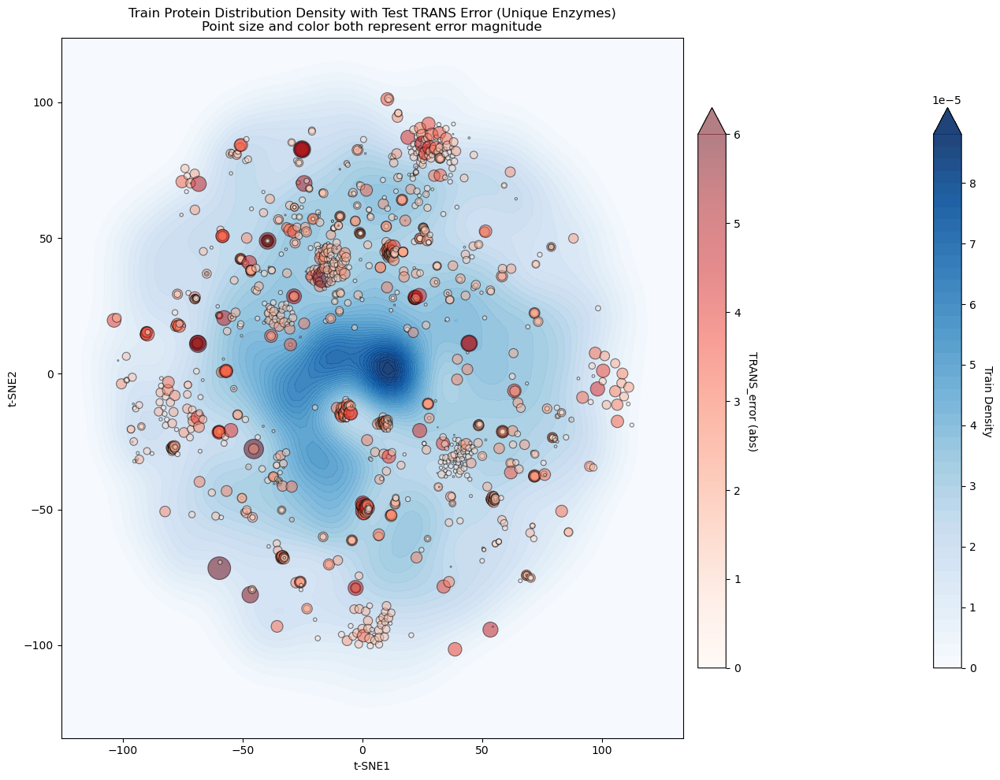

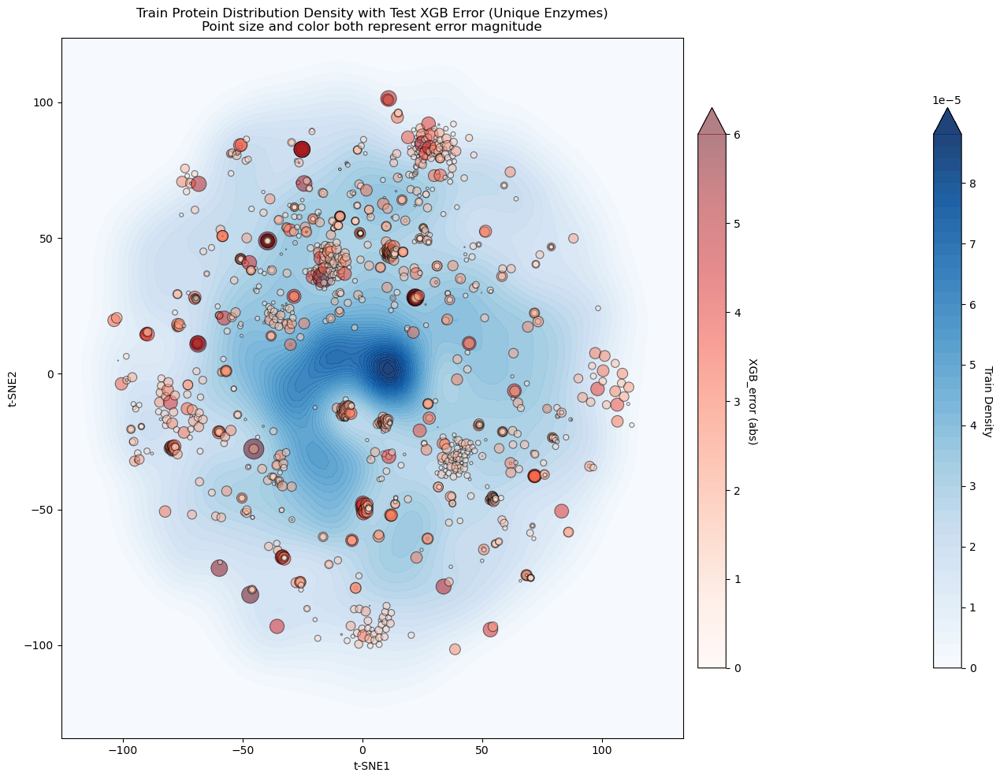

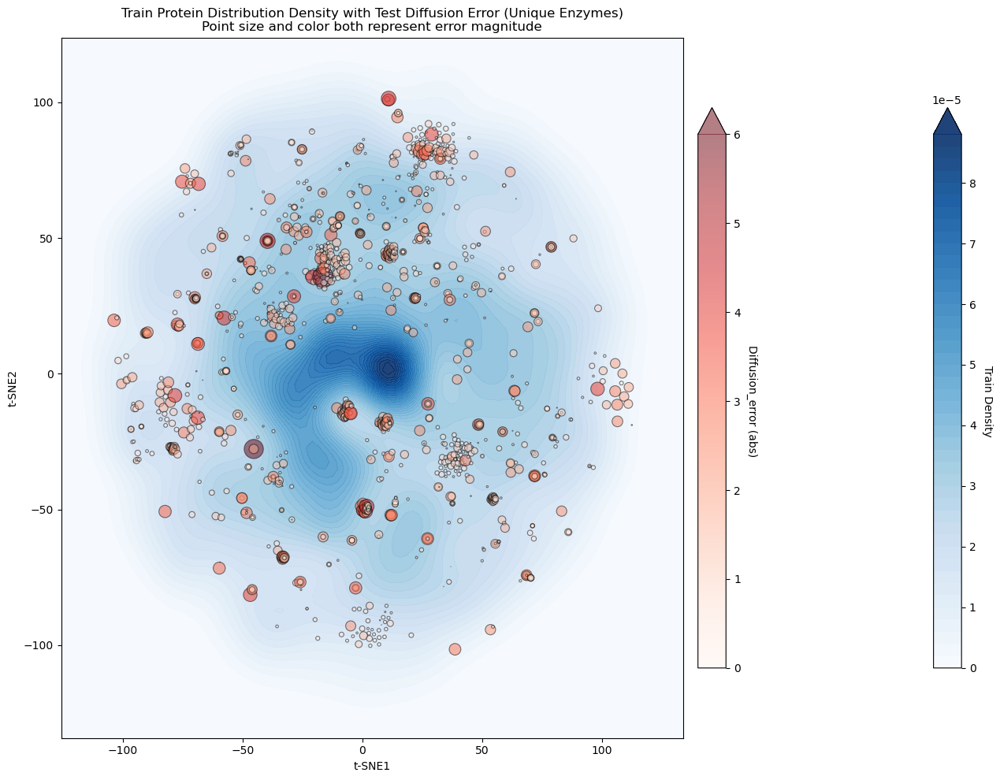

In [26]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde

# Get t-SNE features for training set (protein features)
tsne_train = np.array([x for x in data_with_pred.loc[index_info['train_index'], "TSNE_feature_protein"]])

# Create grid (with padding)
x_padding = (tsne_train[:, 0].max() - tsne_train[:, 0].min()) * 0.1
y_padding = (tsne_train[:, 1].max() - tsne_train[:, 1].min()) * 0.1

x_min, x_max = tsne_train[:, 0].min() - x_padding, tsne_train[:, 0].max() + x_padding
y_min, y_max = tsne_train[:, 1].min() - y_padding, tsne_train[:, 1].max() + y_padding

xx, yy = np.meshgrid(
    np.linspace(x_min, x_max, 100),
    np.linspace(y_min, y_max, 100)
)
grid_points = np.vstack([xx.ravel(), yy.ravel()])

# Calculate density using KDE
kde = gaussian_kde(tsne_train.T)
density = kde(grid_points).reshape(xx.shape)

fig, ax = plt.subplots(figsize=(14, 10))
contour = ax.contourf(xx, yy, density, levels=50, cmap='Blues', alpha=0.9, extend='max') 
cbar1 = plt.colorbar(contour, ax=ax, shrink=0.8, aspect=20, pad=0.12)
cbar1.set_label('Train Density', rotation=270, labelpad=15)
ax.set_xlabel('t-SNE1')
ax.set_ylabel('t-SNE2')
ax.set_title(f'Train Protein Distribution Density')
plt.tight_layout()
plt.savefig("./outlier_data/tsne_density_protein_plot.png", dpi=600)
plt.savefig("./outlier_data/tsne_density_protein_plot.svg")
plt.show()

for col in model_list:
    # Find unique molecules and keep only the one with maximum absolute error
    test_filtered = test_with_pred.copy()
    test_filtered['abs_error'] = np.abs(test_filtered[col+'_error'])

    # Group by protein t-SNE coordinates and keep only the maximum error for each unique molecule
    test_filtered['tsne_coord'] = test_filtered['TSNE_feature_protein'].apply(tuple)
    test_unique = test_filtered.loc[test_filtered.groupby('tsne_coord')['abs_error'].idxmax()]

    # Extract coordinates for plotting (protein features)
    tsne1_values_unique = [tsne_feat[0] for tsne_feat in test_unique["TSNE_feature_protein"]]
    tsne2_values_unique = [tsne_feat[1] for tsne_feat in test_unique["TSNE_feature_protein"]]

    # Calculate point sizes based on error (normalize to reasonable range)
    abs_errors = test_unique['abs_error'].values
    min_size = 0
    max_size = 400
    # Normalize errors to size range
    normalized_sizes = min_size + abs_errors/10 * (max_size - min_size)
    
    # Plot
    fig, ax = plt.subplots(figsize=(14, 10))

    # Layer 1: density heatmap 
    contour = ax.contourf(xx, yy, density, levels=50, cmap='Blues', alpha=0.9,extend='max')
    cbar1 = plt.colorbar(contour, ax=ax, shrink=0.8, aspect=20, pad=0.12)
    cbar1.set_label('Train Density', rotation=270, labelpad=15)

    # Layer 2: test points scatter plot with size and color both representing error
    scatter = ax.scatter(
        tsne1_values_unique,
        tsne2_values_unique,
        c=abs_errors,  # Color represents error
        s=normalized_sizes,  # Size represents error
        cmap="Reds",
        alpha=0.5,
        edgecolors='black',  # Add black edge for better visibility
        linewidth=0.8,   
        vmin=0,
		vmax=6,  # Set color limits for better visibility     
    )
    cbar2 = plt.colorbar(scatter, ax=ax, shrink=0.8, aspect=20, pad=0.02, extend='max')
    cbar2.set_label(f'{col}_error (abs)', rotation=270, labelpad=15)

    ax.set_xlabel('t-SNE1')
    ax.set_ylabel('t-SNE2')
    ax.set_title(f'Train Protein Distribution Density with Test {col} Error (Unique Enzymes)\nPoint size and color both represent error magnitude')
    plt.tight_layout()
    plt.savefig(f"./outlier_data/tsne_density_protein_plot_{col}.png", dpi=600)
    plt.savefig(f"./outlier_data/tsne_density_protein_plot_{col}.svg")
    plt.show()